# 9.49 Final Project Statistical Tests
#### Initially based off the phase_distribution.ipynb file from Pettersen et al. at https://github.com/bioAI-Oslo/VPC/tree/main, modified to include additional tests for cell recruitment.

Results were generated with create_dataset.ipynb, then model_setup.py, then train_rnn.ipynb

Note: Some cells have been modified or moved or cleaned since running, so visible results may not be accurate to current contents.

In [10]:
%matplotlib inline

# Diverse Dataset

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


  0%|          | 0/6 [00:00<?, ?it/s]/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [35:55<00:00, 359.31s/it]

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

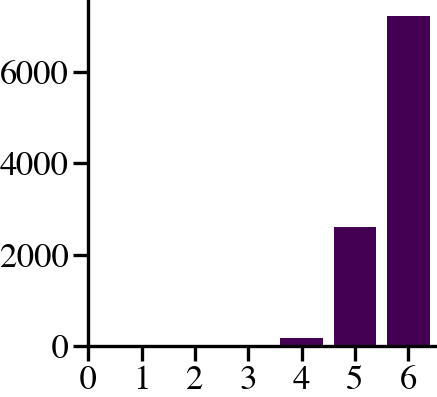

10000 total cells


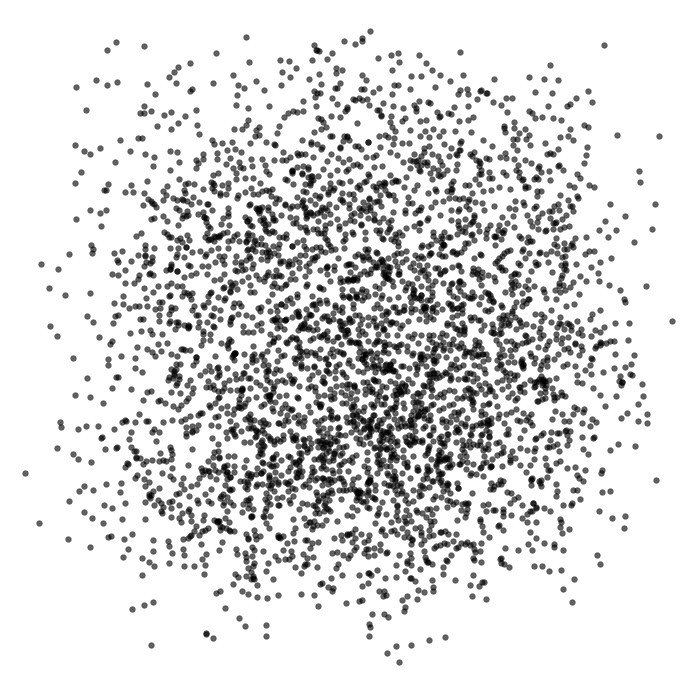

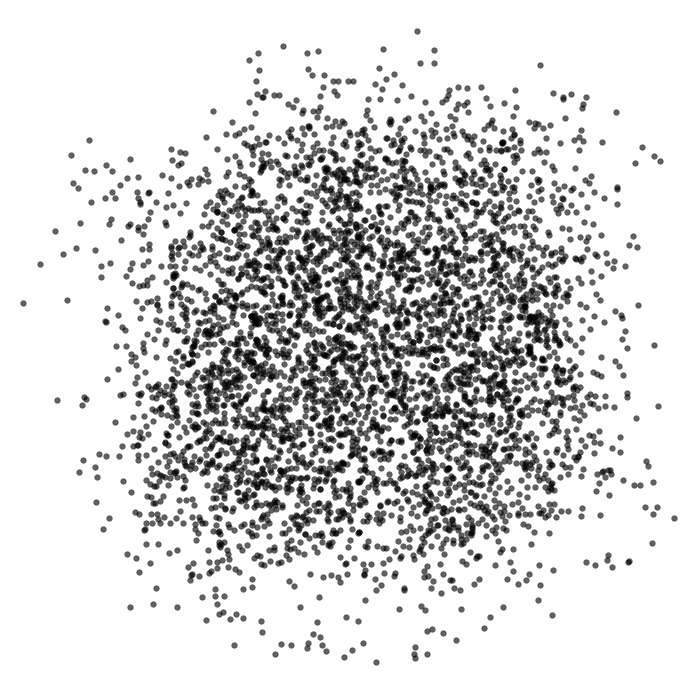

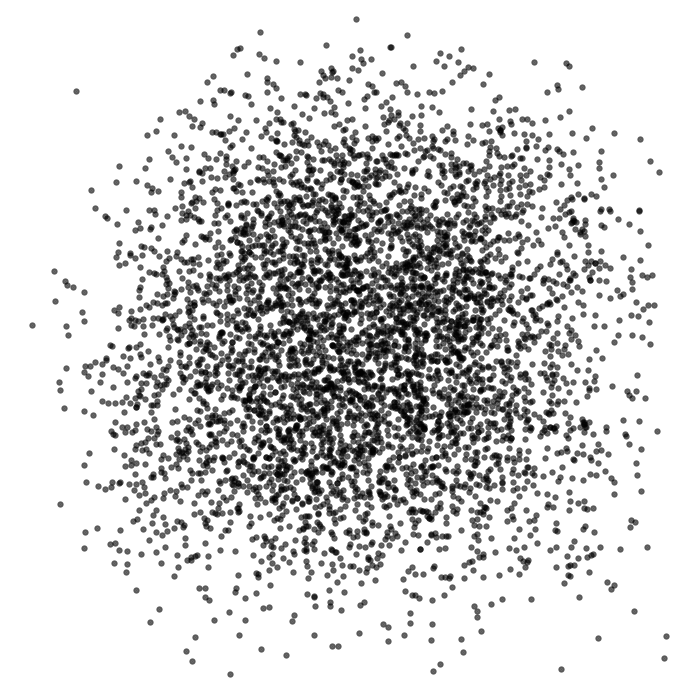

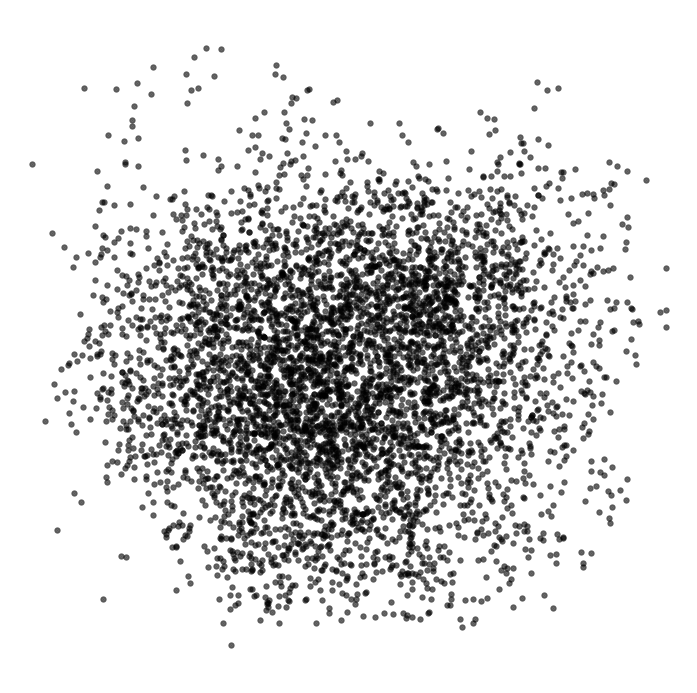

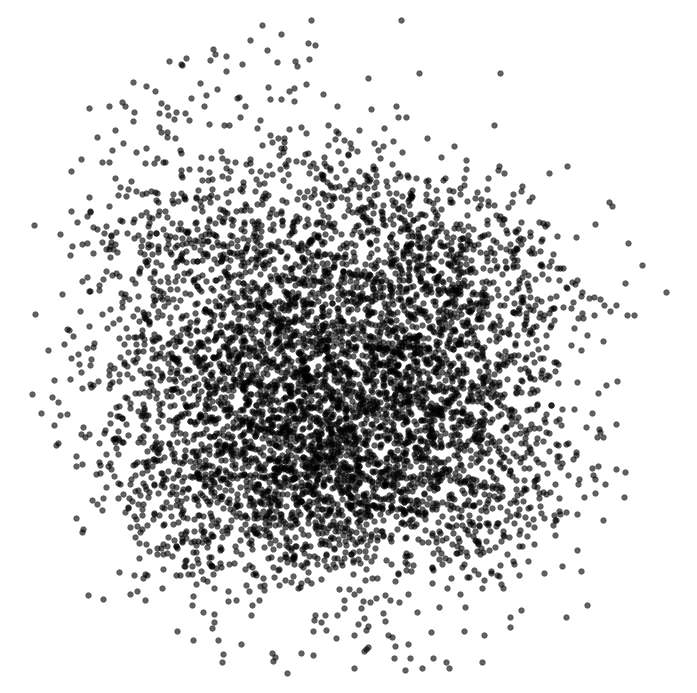

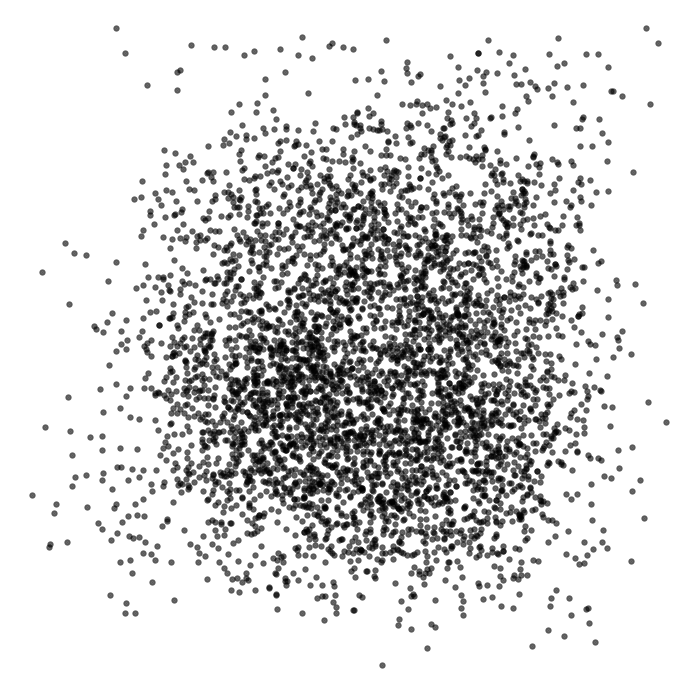

In [11]:

%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

# imports 
import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
# bring in model
path = f"../VPC/model7"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model7") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

envs = environments.Environments()
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []


# Establish centers (not my code)
states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

# Find the number of rooms each cell is active in

shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
# print(total_over_1)

# Find the number of cells active in each number of rooms
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

# Plot as bar graph
matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

# Verify 10,000 total cells
total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')
np.save("./centers7.npy", centers) # save data

# Plot centers
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))


['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


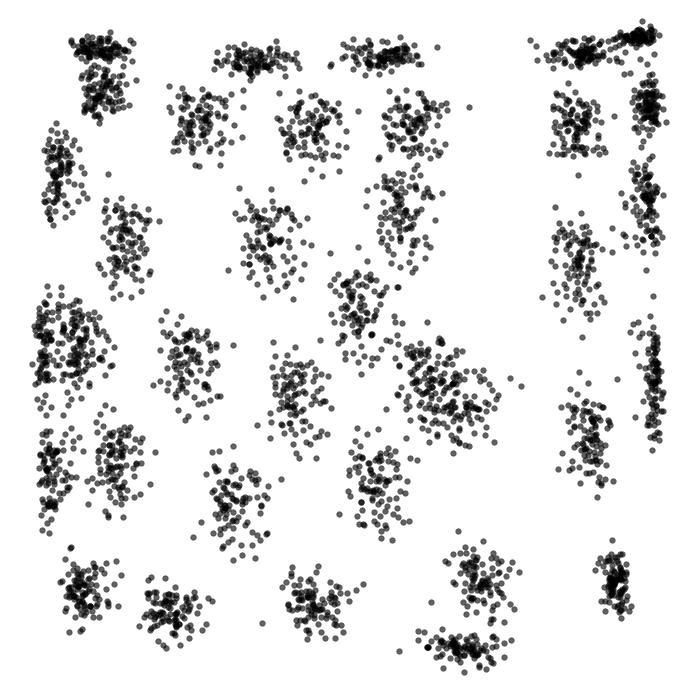

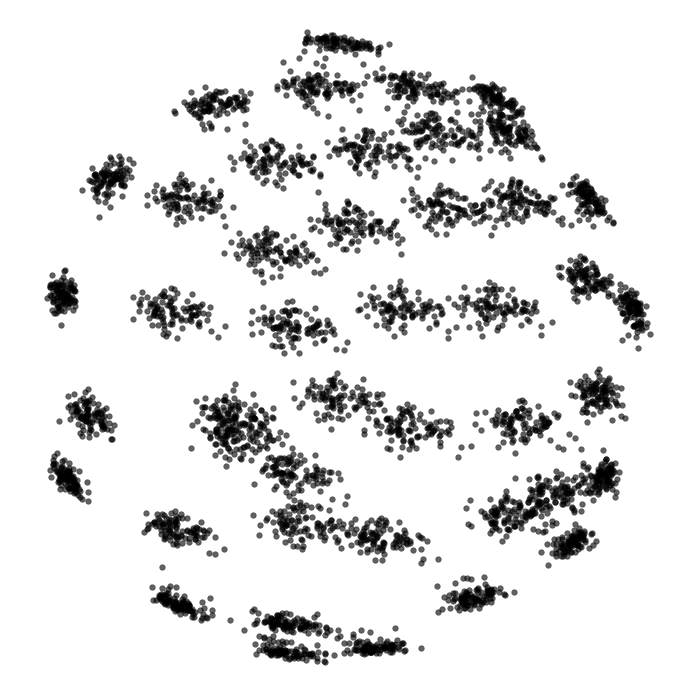

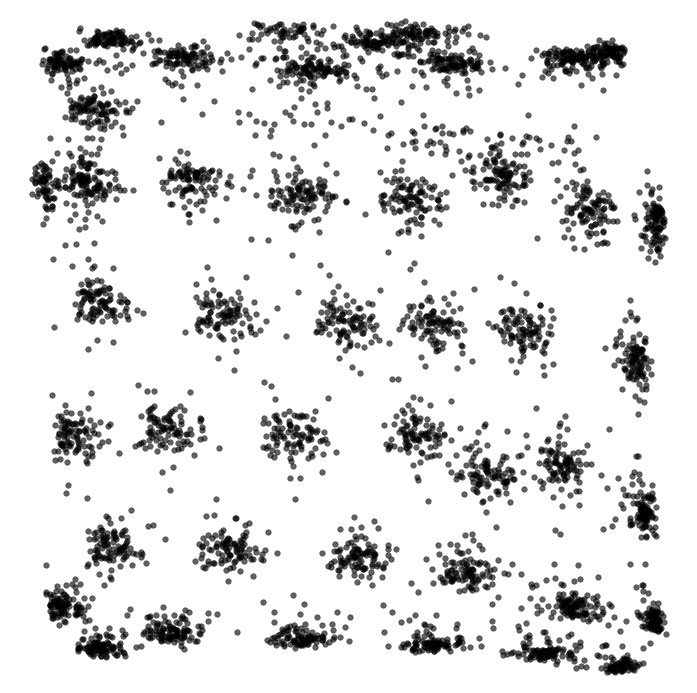

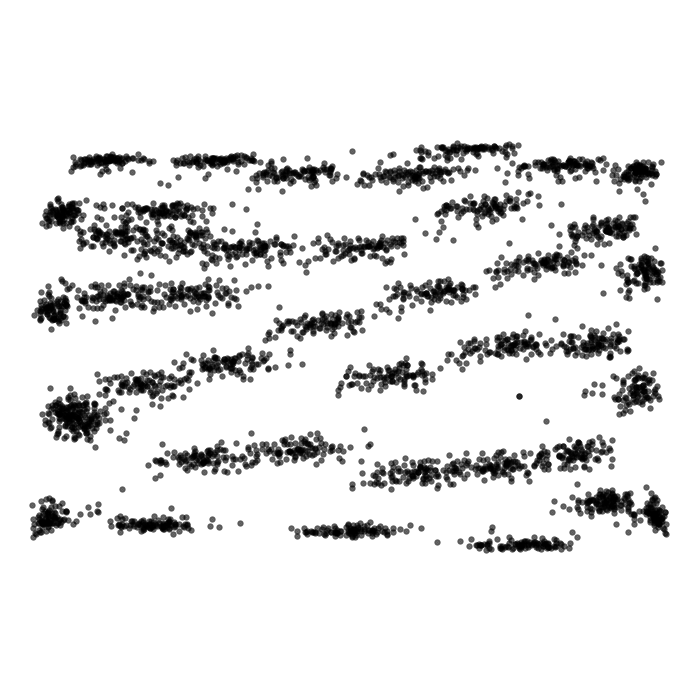

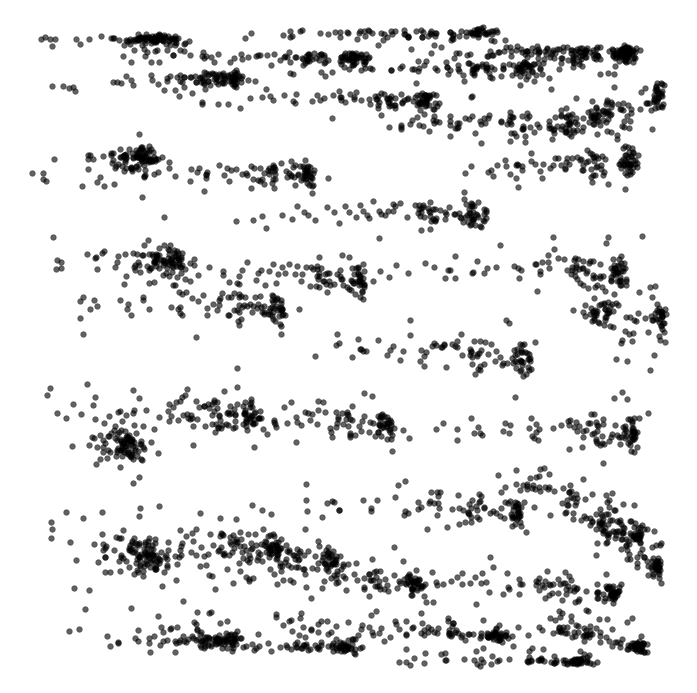

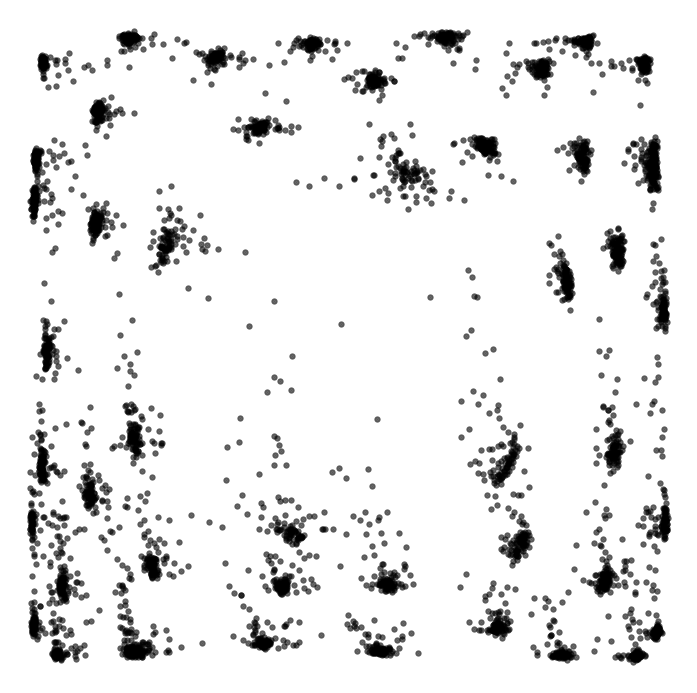

In [49]:
centers = np.load("./centers7.npy")
si_masks = []
masks = []

for current_centers in centers:
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(3):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2)
for i in range(3):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2)

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)


lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

In [12]:
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools

In [13]:
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model2"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type) # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

In [14]:
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2)

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


In [15]:
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

In [16]:

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)

  0%|          | 0/6 [00:00<?, ?it/s]/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [1:03:49<00:00, 638.22s/it]


In [17]:
print(sequence)

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

In [18]:
print(centers.shape)

(6, 100, 100, 2)


In [19]:
print(centers)

[[[[ 0.          0.        ]
   [ 0.          0.        ]
   [-0.74743783 -0.91919762]
   ...
   [ 0.27920318 -0.02766657]
   [ 0.88624805  0.2886543 ]
   [ 0.          0.        ]]

  [[ 0.          0.        ]
   [ 0.          0.        ]
   [-0.75521368 -0.92279708]
   ...
   [ 0.26500812 -0.03529537]
   [ 0.87883735  0.26035726]
   [ 0.9549942  -0.84726679]]

  [[ 0.          0.        ]
   [ 0.86619675  0.56956053]
   [-0.75372922 -0.92291528]
   ...
   [ 0.22444087 -0.03388466]
   [ 0.83225179  0.24329039]
   [ 0.8546735  -0.79155034]]

  ...

  [[ 0.          0.        ]
   [ 0.          0.        ]
   [-0.7224074  -0.89643115]
   ...
   [ 0.29301983 -0.02381973]
   [ 0.90537894  0.26675391]
   [ 0.          0.        ]]

  [[ 0.98465836  0.05389201]
   [ 0.66851789  0.61631864]
   [-0.91826427 -0.952362  ]
   ...
   [-0.35651141 -0.04103339]
   [ 0.43306932  0.23423469]
   [ 0.86533833 -0.80504829]]

  [[ 0.          0.        ]
   [ 0.          0.        ]
   [-0.73406106 -0.9

In [20]:
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

In [21]:
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

((6, 100, 100, 2), (30, 100, 2))

In [22]:
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
# total_over_1 = 0
# for key in shared_centers:
#     if shared_centers[key] > 1:
#         print(shared_centers[key])
#         total_over_1 += 1
# print(total_over_1)

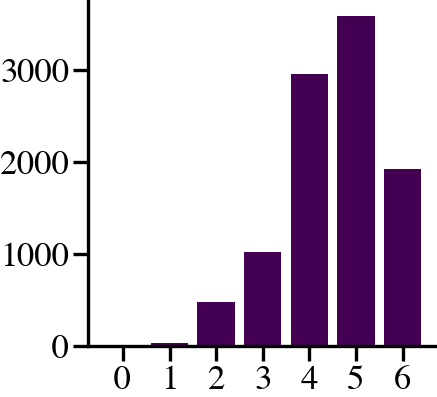

In [23]:
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()


In [24]:
total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')

10000 total cells


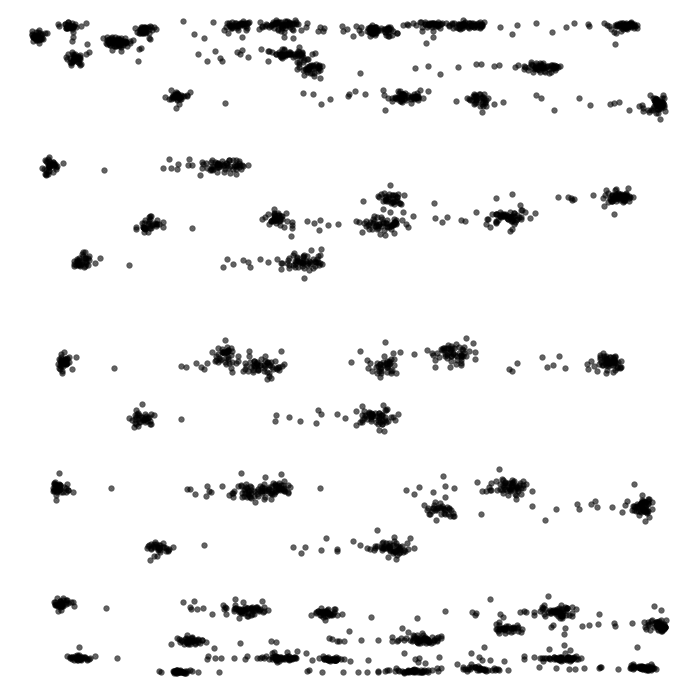

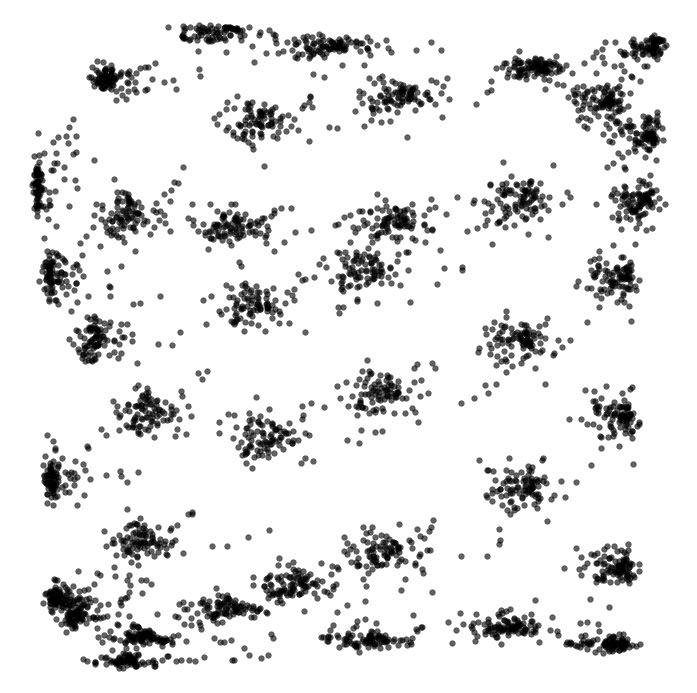

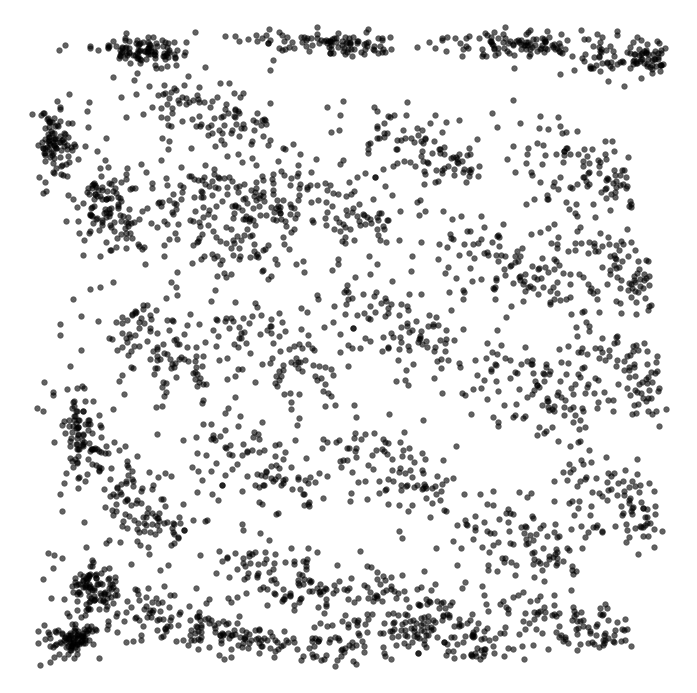

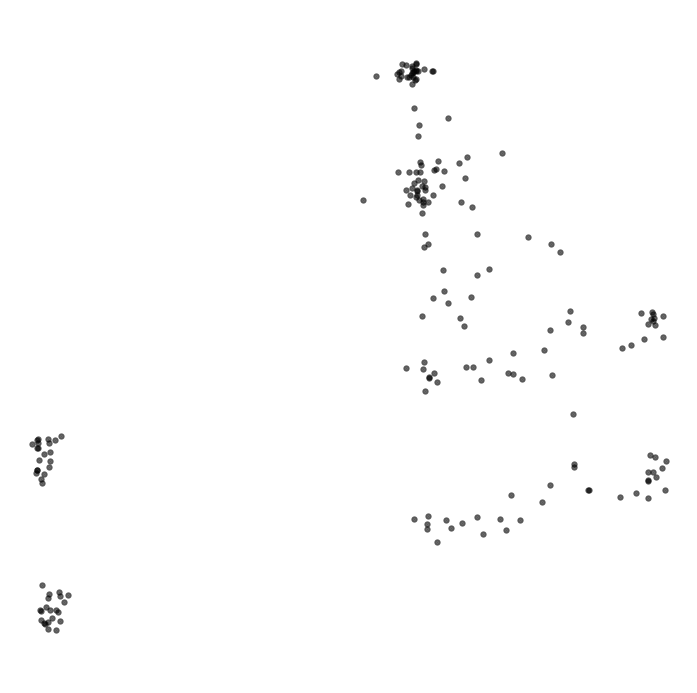

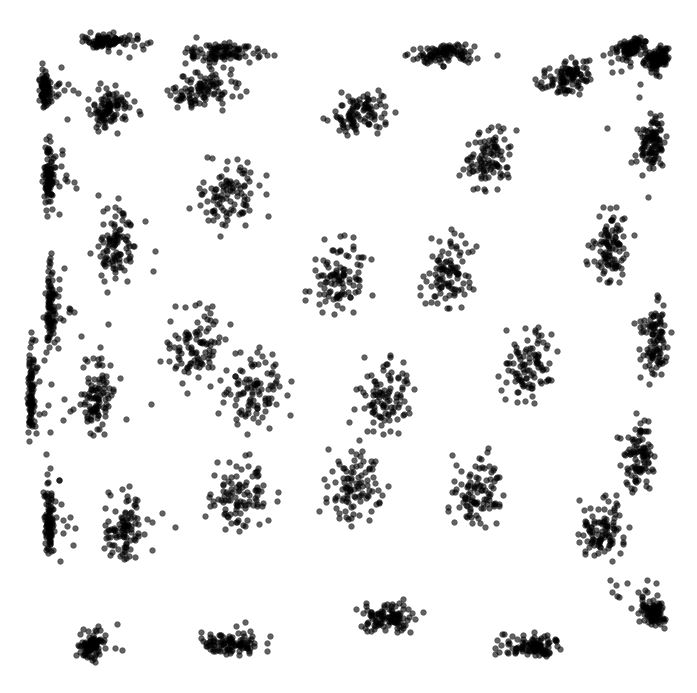

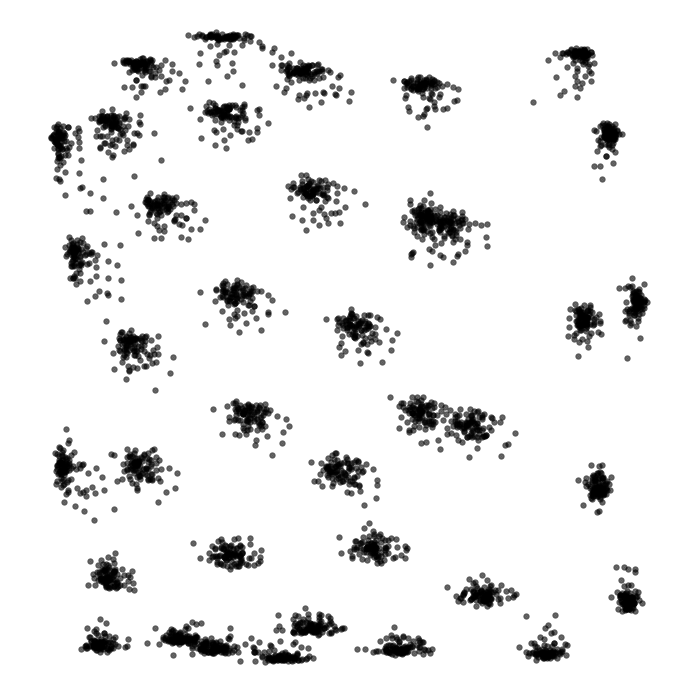

In [25]:
np.save("./centers2.npy", centers)
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

In [55]:
centers = np.load("centers2.npy")
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Six Squares Average:', total/div)

centers = np.load("centers4.npy")
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Six Circles Average:', total/div)



centers = np.load("centers5.npy")
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Six 4x Squares Average:', total/div)


centers = np.load("centers7.npy")
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Diverse Environments Average:', total/div)

Six Squares Average: 4.5316
Six Circles Average: 4.7569
Six 4x Squares Average: 2.9262
Diverse Environments Average: 5.7058


In [58]:
centers = np.load("centers7.npy")
shared_centers = {}
i = 0
for j in range(centers[i].shape[0]):
    for k in range(centers[i].shape[1]):
        cell = (j,k)
        pos = tuple(centers[i][j][k])
        if pos[0] != 0 or pos[1] != 0:
            if cell in shared_centers:
                shared_centers[cell] += 1
            else:
                shared_centers[cell] = 1
        elif not cell in shared_centers:
            shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Standard Square Likelihood:', total/div)

shared_centers = {}
i = 2
for j in range(centers[i].shape[0]):
    for k in range(centers[i].shape[1]):
        cell = (j,k)
        pos = tuple(centers[i][j][k])
        if pos[0] != 0 or pos[1] != 0:
            if cell in shared_centers:
                shared_centers[cell] += 1
            else:
                shared_centers[cell] = 1
        elif not cell in shared_centers:
            shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('1.5x Square Likelihood:', total/div)


centers = np.load("centers5.npy")
shared_centers = {}
i = 2
for j in range(centers[i].shape[0]):
    for k in range(centers[i].shape[1]):
        cell = (j,k)
        pos = tuple(centers[i][j][k])
        if pos[0] != 0 or pos[1] != 0:
            if cell in shared_centers:
                shared_centers[cell] += 1
            else:
                shared_centers[cell] = 1
        elif not cell in shared_centers:
            shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('4x Square Likelihood:', total/div)

Standard Square Likelihood: 0.8868
1.5x Square Likelihood: 0.9558
4x Square Likelihood: 0.4217


In [64]:
centers = np.load("centers2.npy")
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0

total = 0
div = 0
for key in shared_centers:
    total += shared_centers[key]
    div += 1

print('Six Squares Average:', total/div)
print('Six Squares Likelihood:', total/div/6)

p_square = total/div/6

Six Squares Average: 4.5316
Six Squares Likelihood: 0.7552666666666666


In [93]:
resultslist = []
for key in shared_centers:
    resultslist.append(shared_centers[key])
print(resultslist)
print(len(resultslist))

[5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 6, 5, 6, 6, 6, 6, 5, 5, 6, 6, 5, 6, 5, 6, 3, 6, 6, 6, 5, 5, 5, 5, 6, 5, 5, 5, 5, 6, 6, 6, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 4, 5, 5, 5, 5, 4, 5, 4, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 4, 6, 6, 5, 6, 6, 5, 5, 4, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 5, 5, 6, 5, 4, 4, 6, 5, 4, 6, 4, 5, 2, 5, 5, 6, 5, 5, 3, 5, 5, 5, 6, 5, 6, 6, 5, 6, 4, 4, 5, 5, 5, 6, 5, 6, 2, 5, 5, 5, 2, 5, 4, 4, 6, 6, 4, 5, 4, 6, 6, 6, 4, 4, 4, 5, 5, 4, 4, 3, 4, 5, 5, 3, 4, 5, 4, 5, 4, 5, 4, 6, 5, 4, 4, 6, 5, 5, 4, 3, 3, 2, 4, 6, 4, 6, 4, 6, 4, 2, 5, 3, 3, 5, 5, 4, 5, 6, 5, 5, 5, 4, 6, 6, 4, 5, 4, 4, 4, 5, 4, 5, 3, 4, 4, 5, 5, 5, 2, 5, 6, 5, 6, 5, 6, 5, 5, 5, 3, 5, 4, 4, 4, 6, 4, 6, 2, 5, 5, 4, 2, 5, 4, 4, 5, 4, 4, 6, 4, 6, 5, 5, 4, 2, 5, 5, 5, 4, 4, 5, 4, 5, 5, 3, 5, 5, 4, 5, 4, 5, 4, 5, 5, 4, 5, 6, 5, 5, 3, 3, 4, 3, 5, 6, 4, 6, 4, 5, 4, 2, 5, 3, 5, 6, 4, 3, 5, 6, 5, 2, 4, 4, 5, 6, 4, 5, 4, 5, 4, 6, 4, 5, 3, 6, 5, 5, 5, 5, 3, 5, 6, 5, 6, 5, 6, 6, 4, 5, 3, 5, 6, 4, 4, 6, 3, 6, 2, 

In [70]:
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

# Six Circles

In [50]:
%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model4"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model4") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(50)

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

In [51]:

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()


  0%|          | 0/6 [00:00<?, ?it/s]/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [2:48:42<00:00, 1687.02s/it]  

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

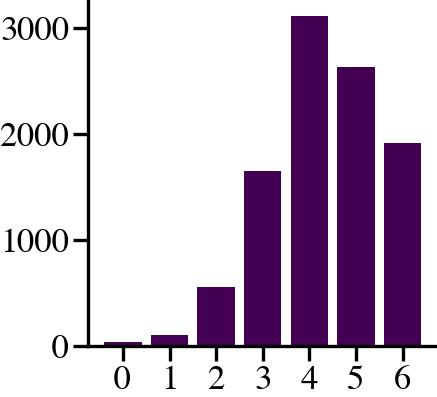

10000 total cells


In [52]:
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')

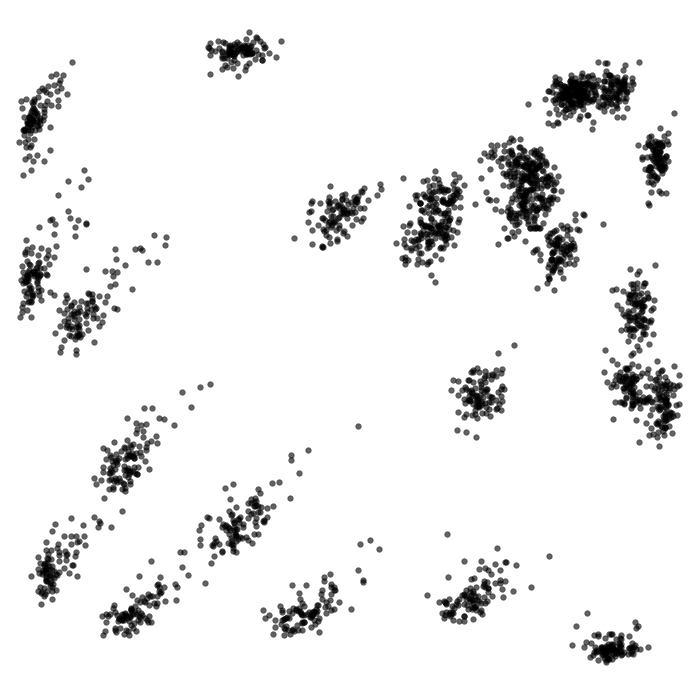

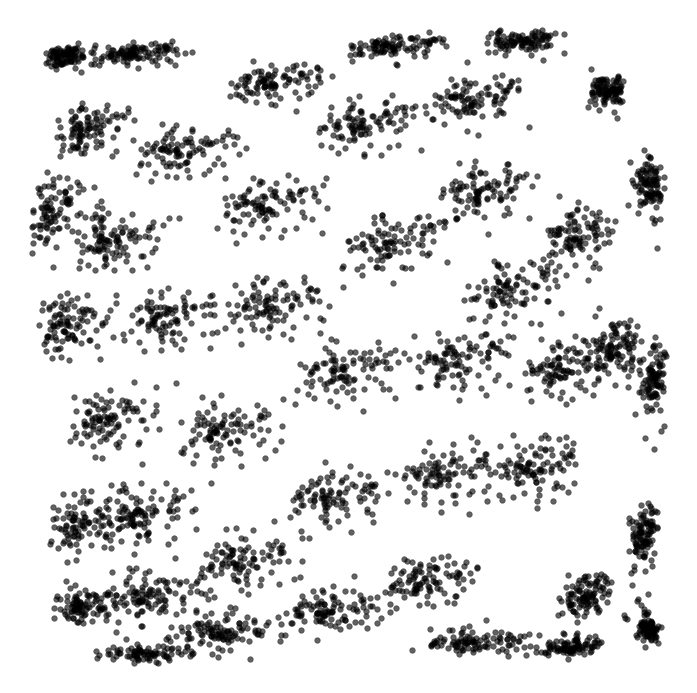

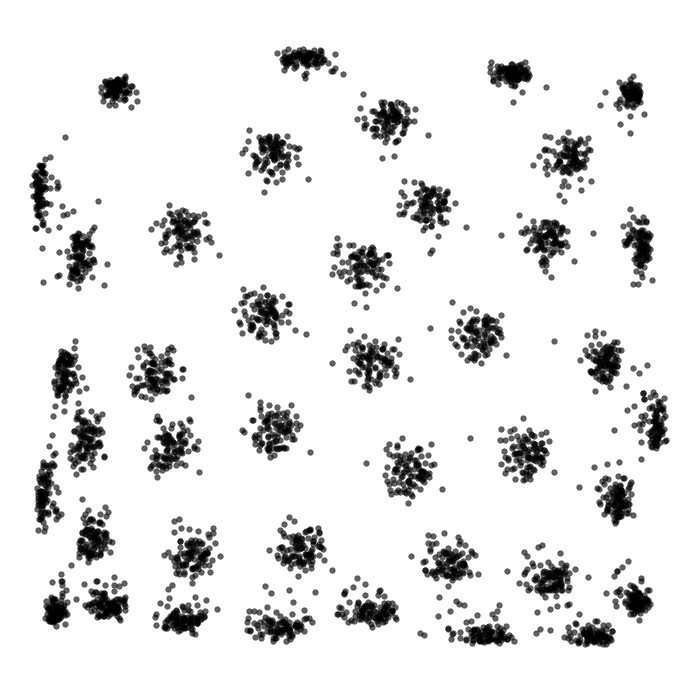

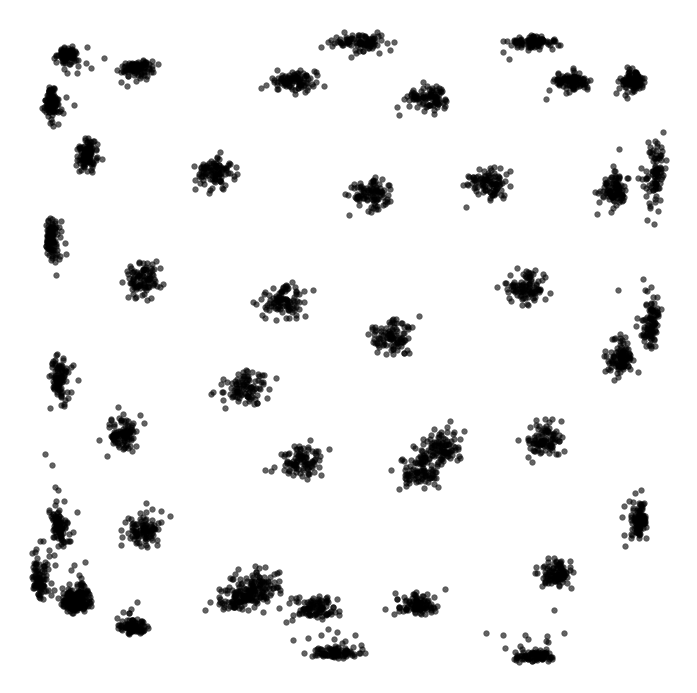

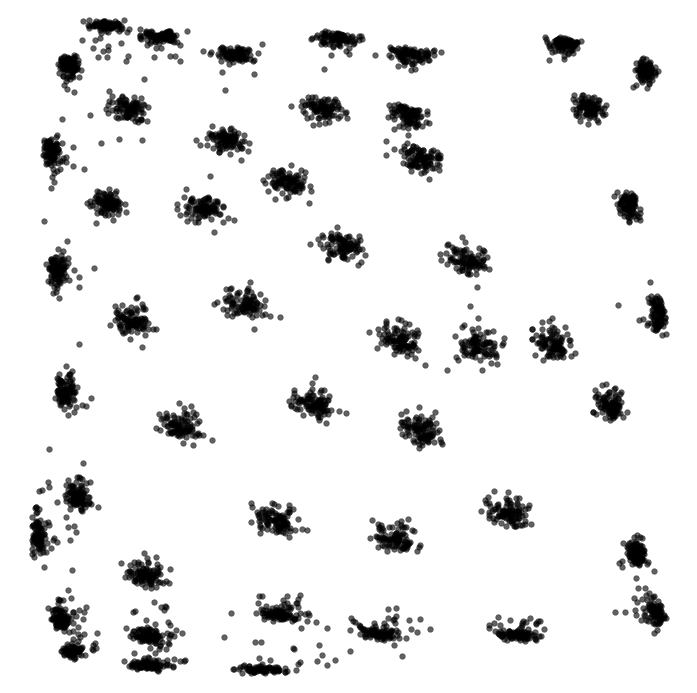

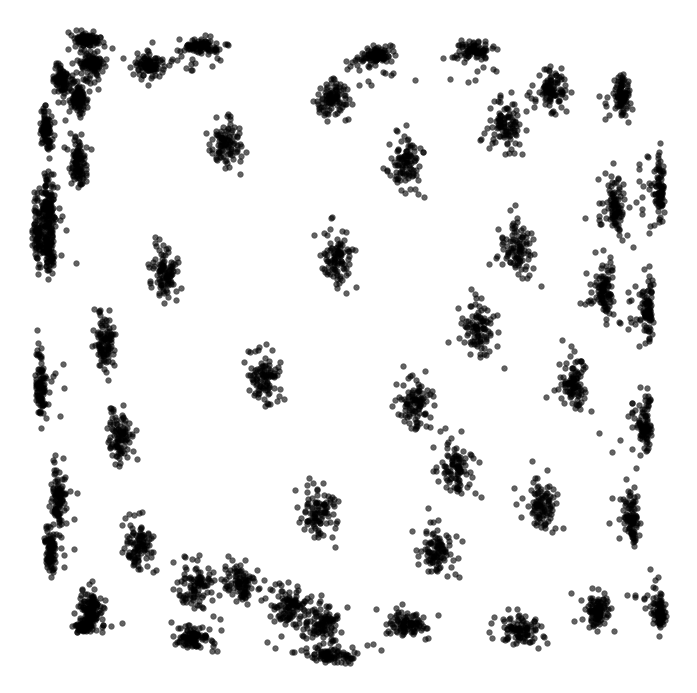

In [29]:
np.save("./centers4.npy", centers)

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

# Six Big Squares

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


  0%|          | 0/6 [00:00<?, ?it/s]

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [36:11<00:00, 361.90s/it]

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

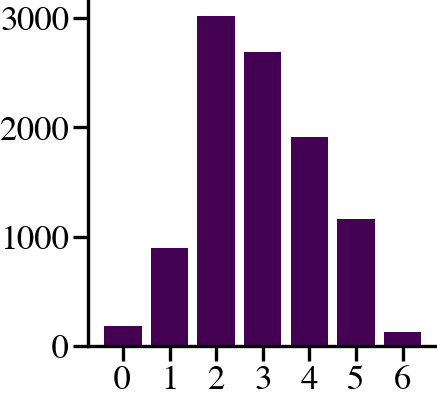

10000 total cells


In [30]:
%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model5"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model5") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2) * 5

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
total_over_1 = 0
for key in shared_centers:
    if shared_centers[key] > 1:
        print(shared_centers[key])
        total_over_1 += 1
# print(total_over_1)
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')

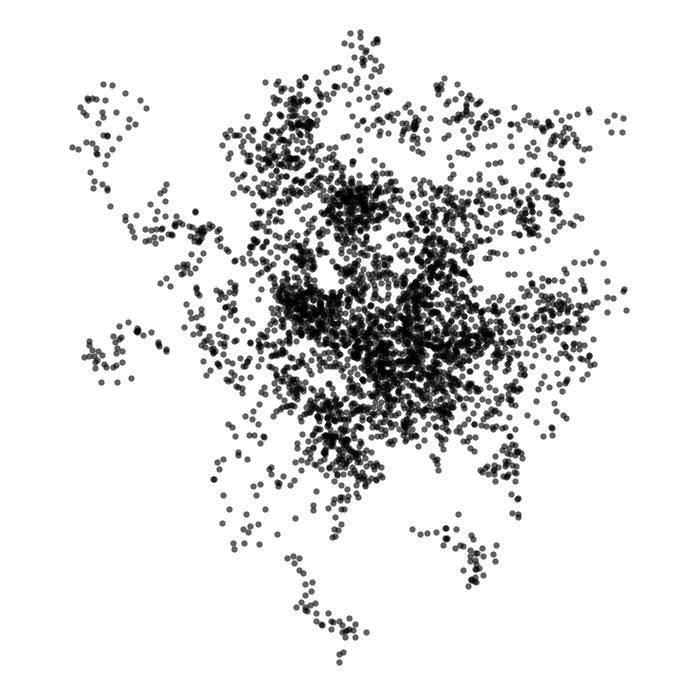

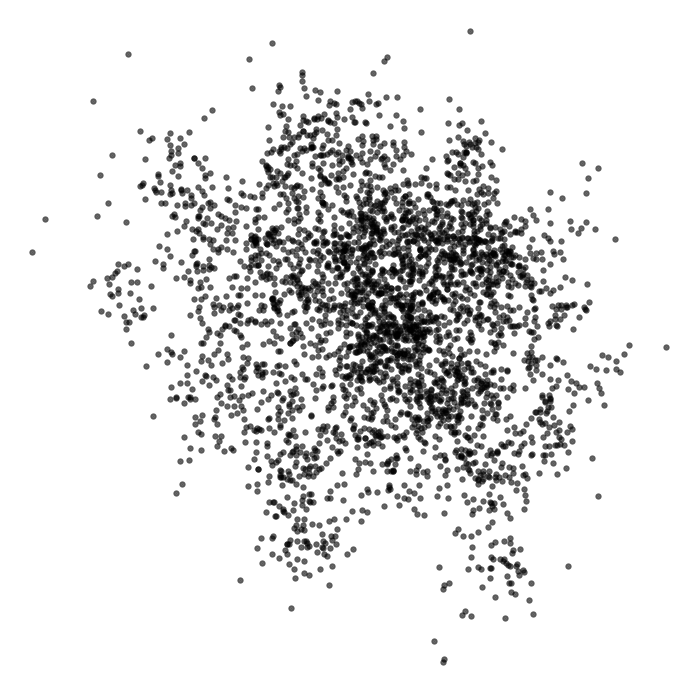

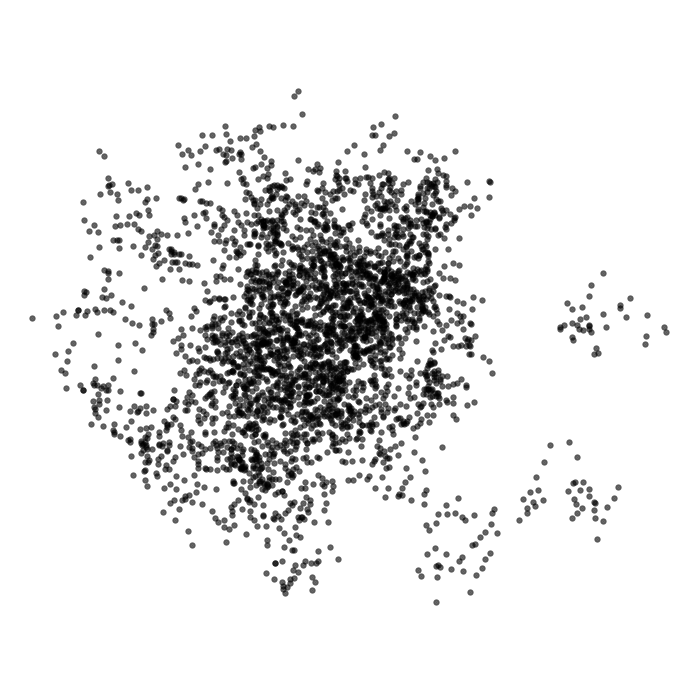

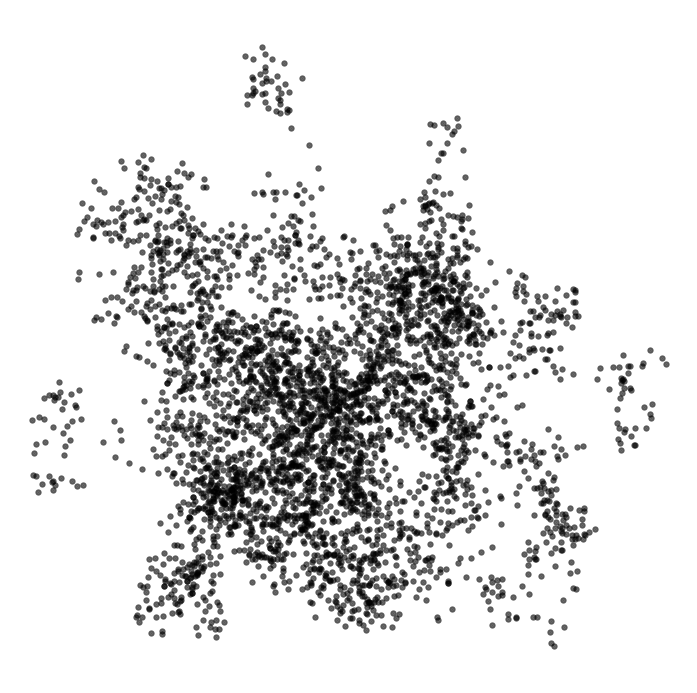

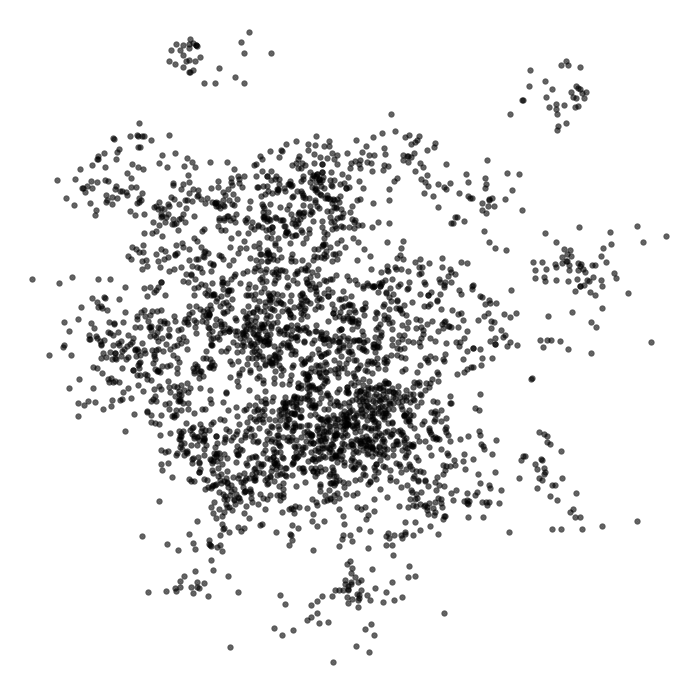

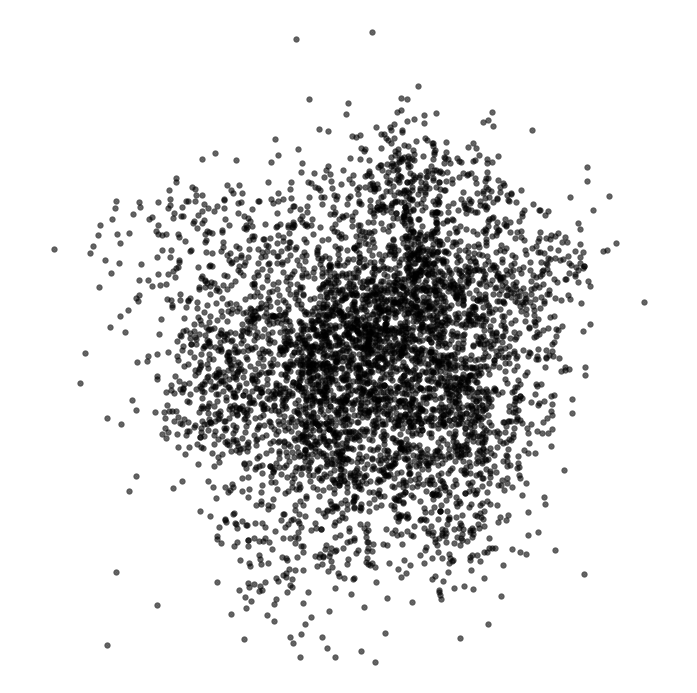

*************************


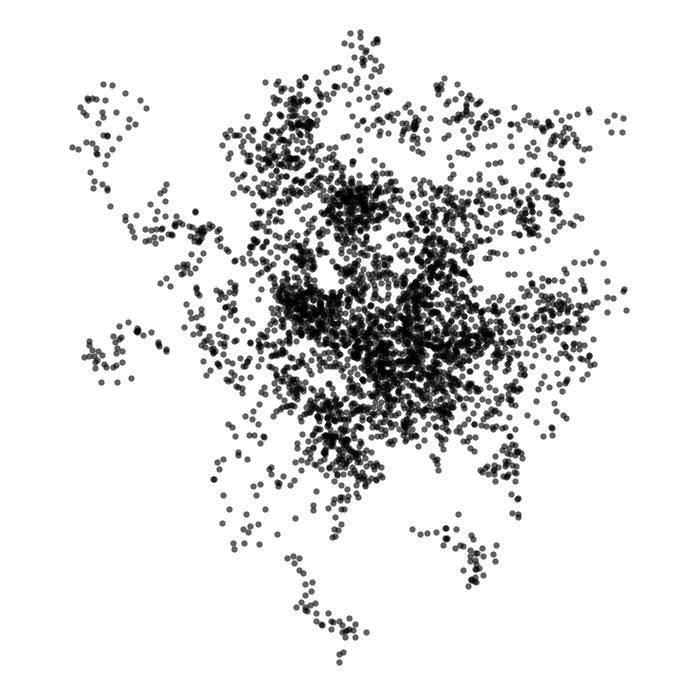

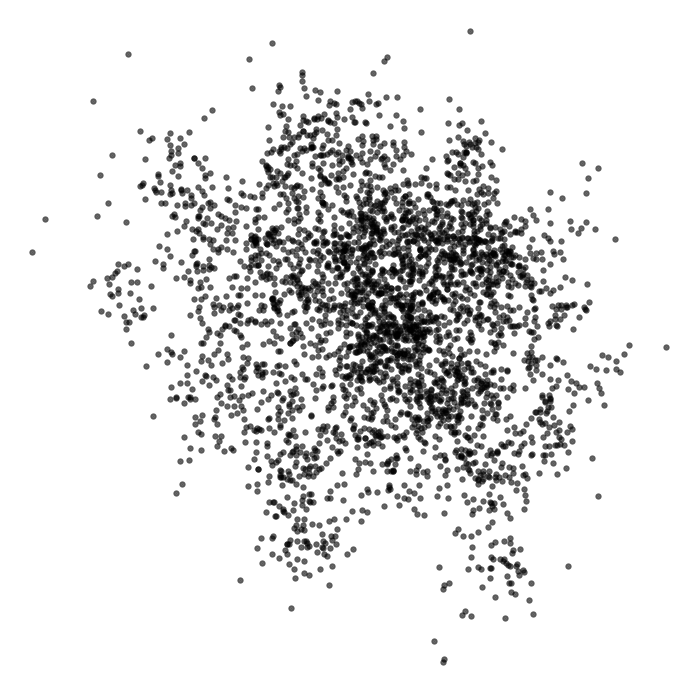

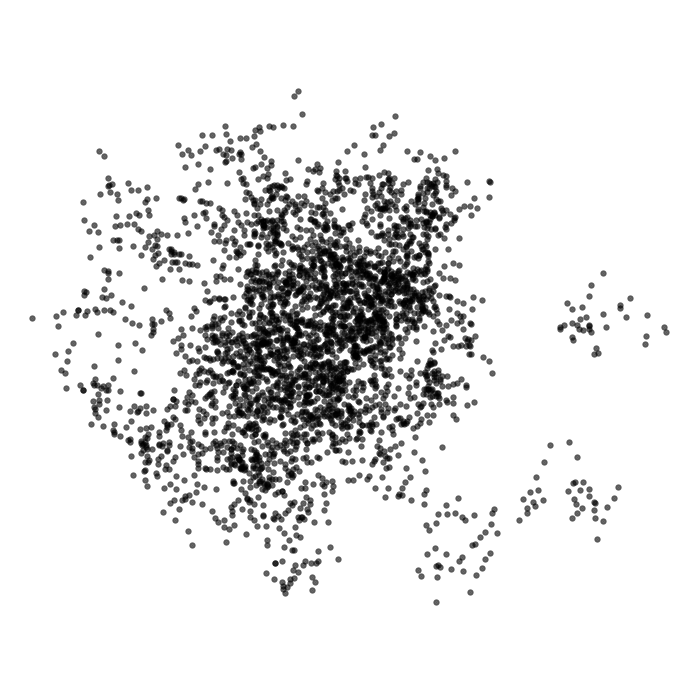

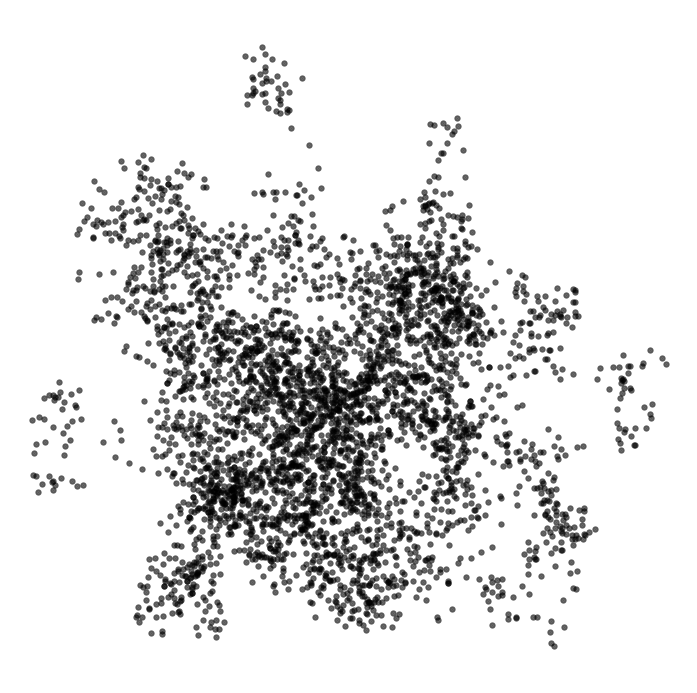

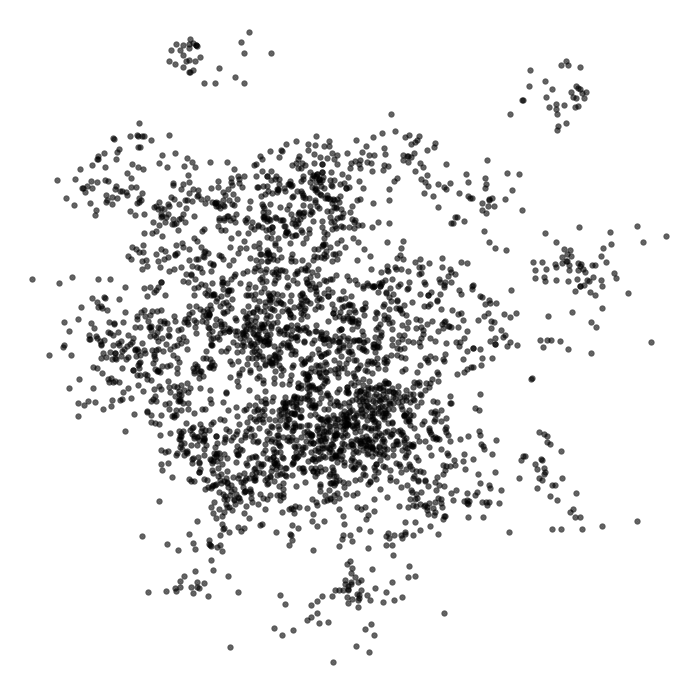

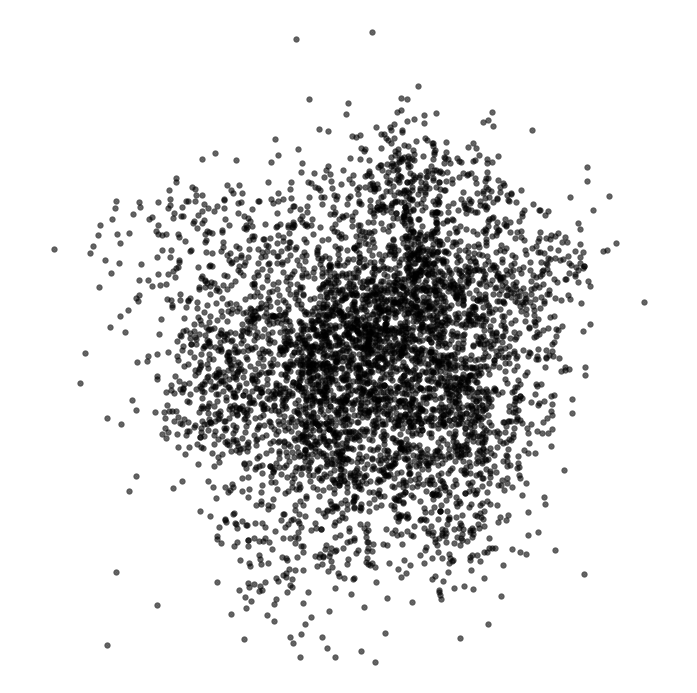

In [31]:
np.save("./centers5.npy", centers)
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*16.05
centers.shape, nonzero_centers[0].shape
print('*************************')

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

# Six Huge Squares

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


  0%|          | 0/6 [00:00<?, ?it/s]

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [35:49<00:00, 358.30s/it]

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

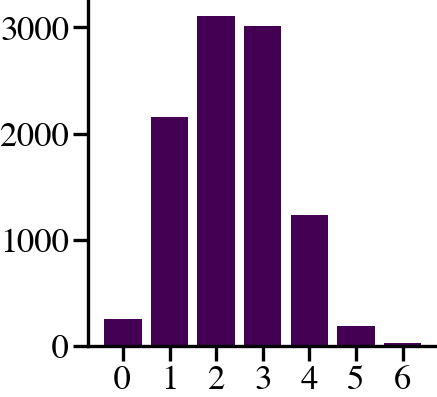

10000 total cells


In [32]:
%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model6"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model6") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2) * 8

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
# print(total_over_1)
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')

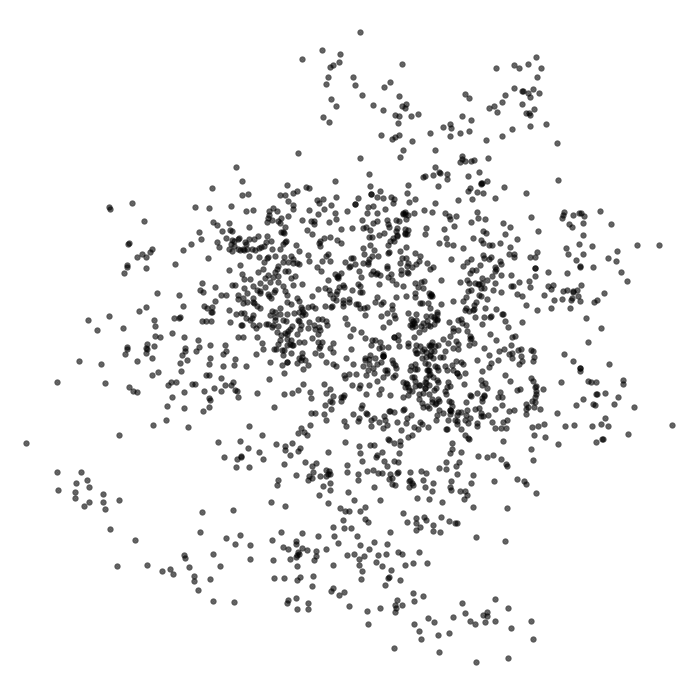

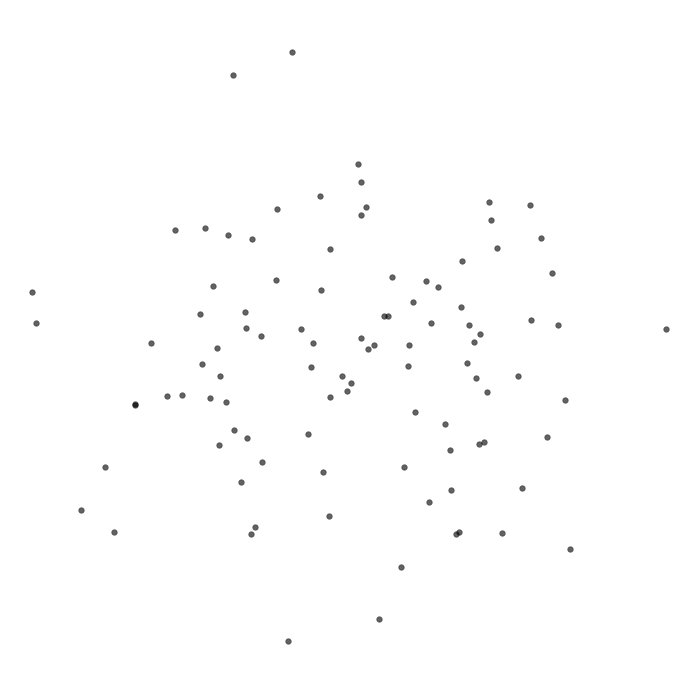

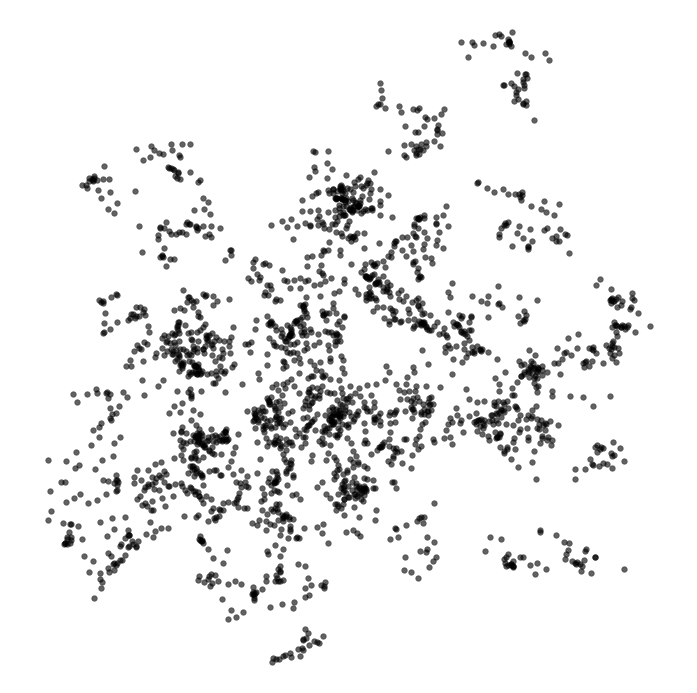

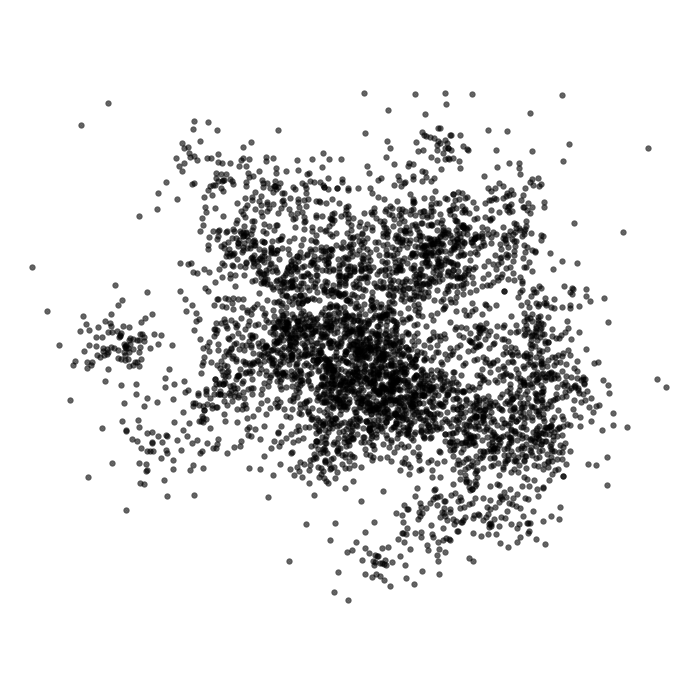

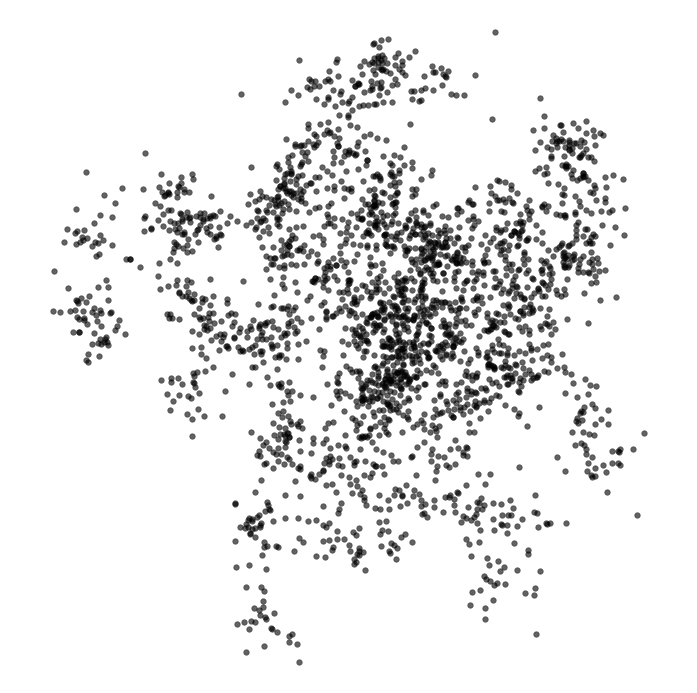

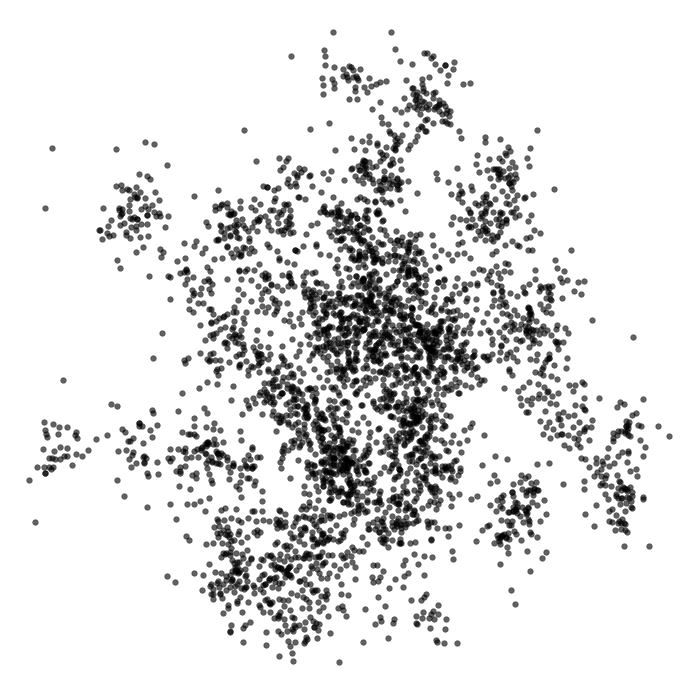

*************************


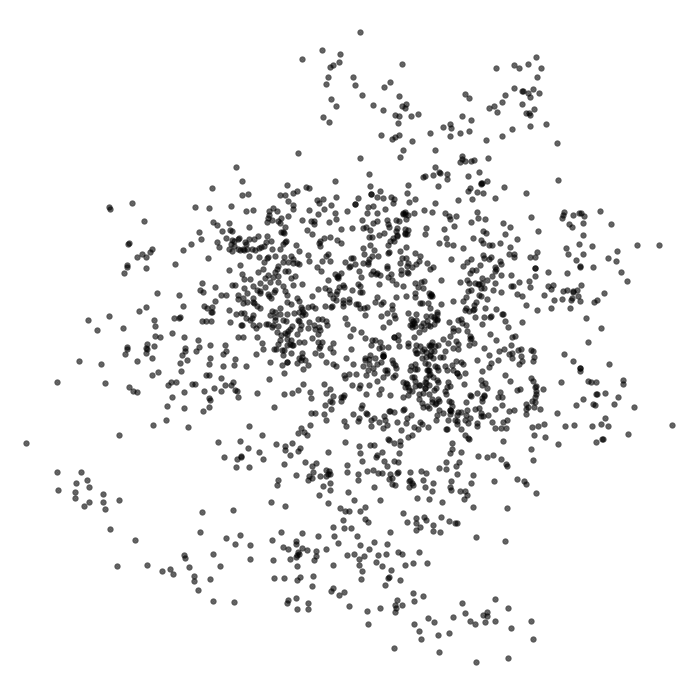

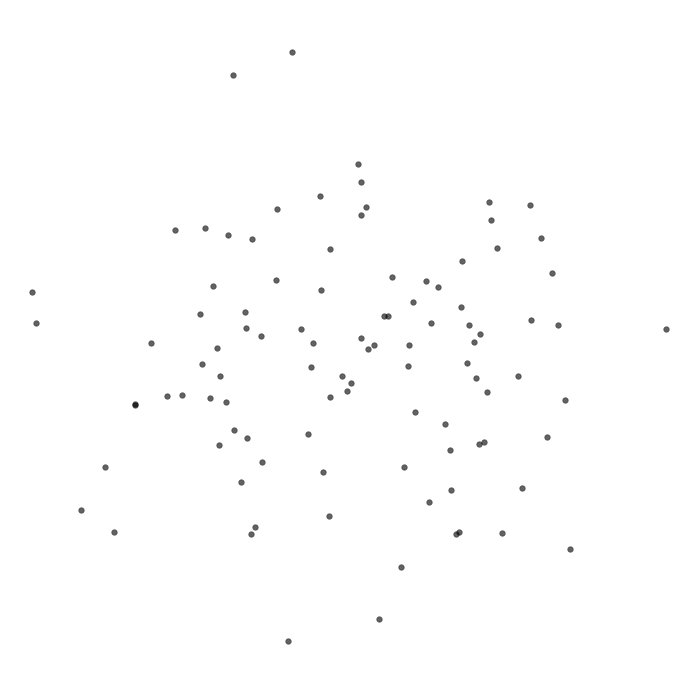

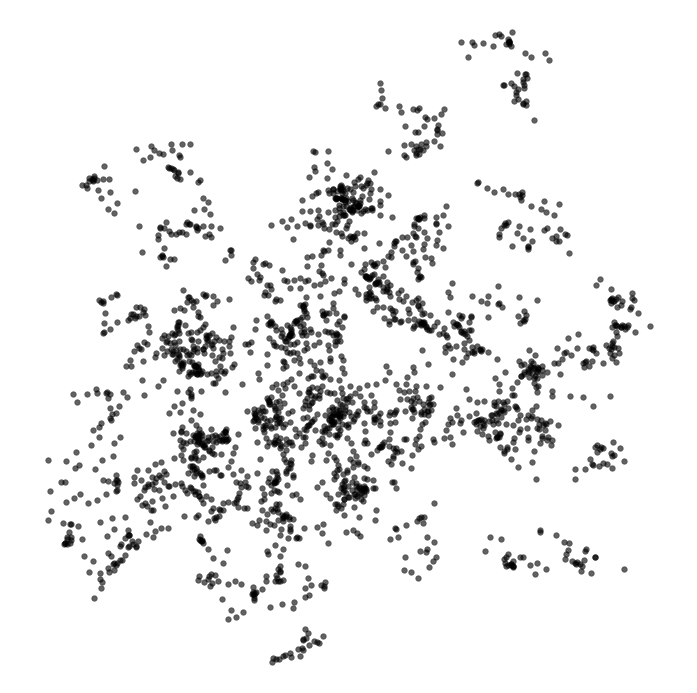

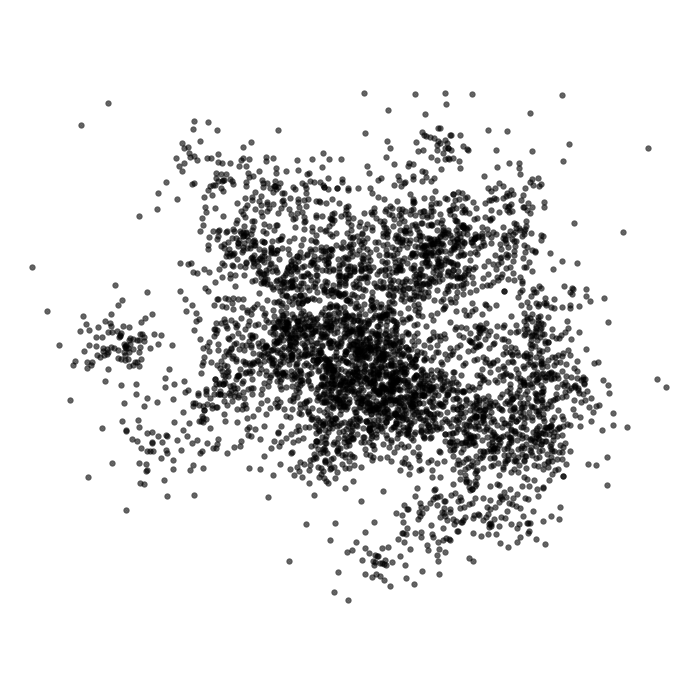

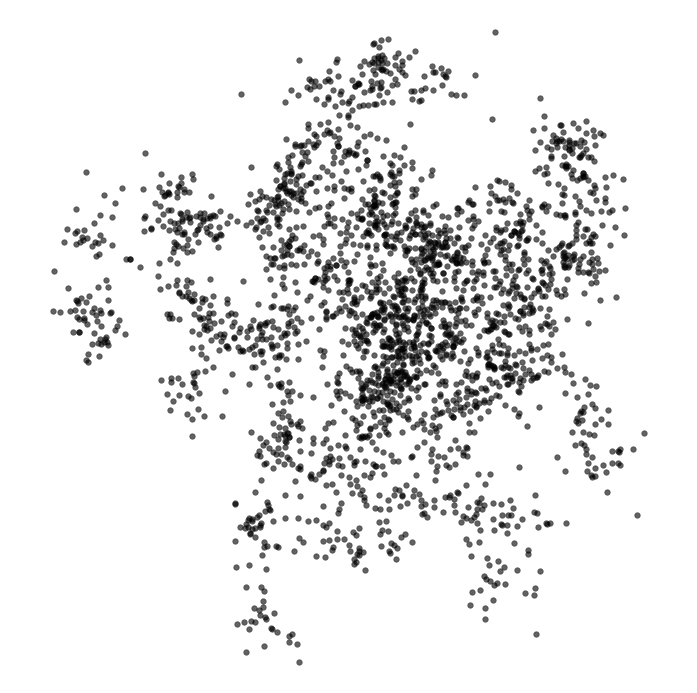

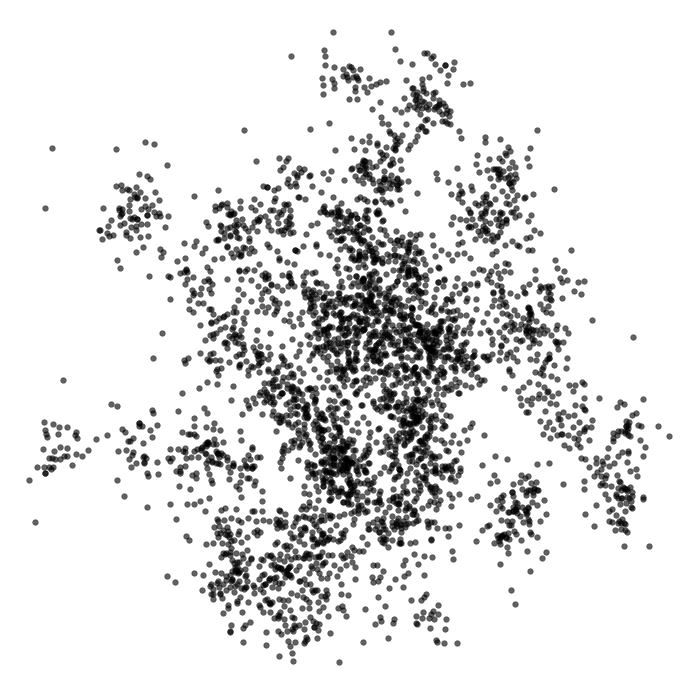

In [33]:
np.save("./centers7.npy", centers)
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*64.05
centers.shape, nonzero_centers[0].shape
print('*************************')

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

# Diverse Dataset

/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/analysis_tools.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path + name, map_location = torch.d

['square0', 'square1', 'square2', 'square3', 'square4', 'square5']


  0%|          | 0/6 [00:00<?, ?it/s]/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in divide
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: divide by zero encountered in log2
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
/Users/lilahlindemann/Downloads/9.49/VPC/notebooks/../notebooks/project_stats.py:73: RuntimeWarning: invalid value encountered in multiply
  spatial_information = np.nansum(occupancy*mean_bin_rate*np.log2(mean_bin_rate/mean_rate[:,None,None]), axis = (1, 2))
100%|██████████| 6/6 [36:11<00:00, 361.89s/it]

['square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5', 'square5'

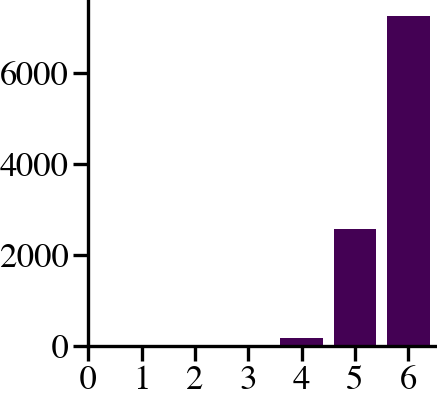

10000 total cells


In [34]:
%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model7"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model7") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(4) @ rotation_matrix(np.pi / 4)*np.sqrt(2) * 8

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
# print(total_over_1)
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')

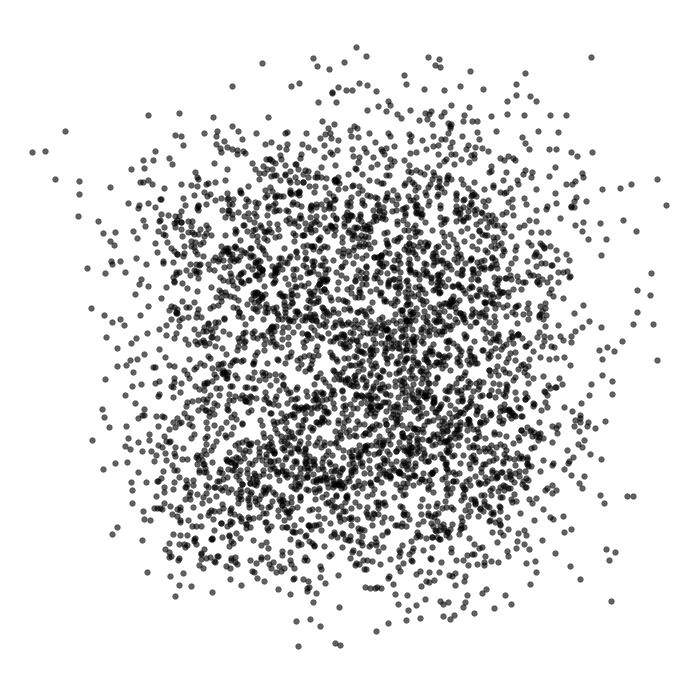

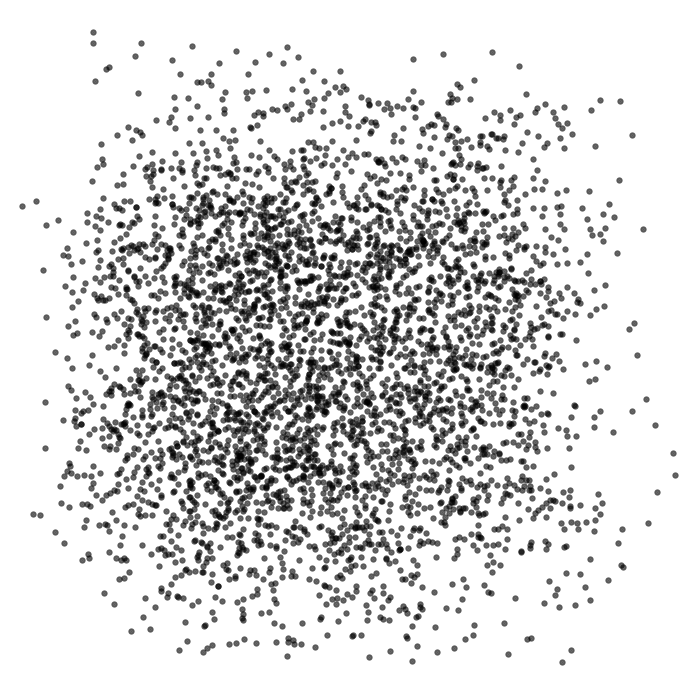

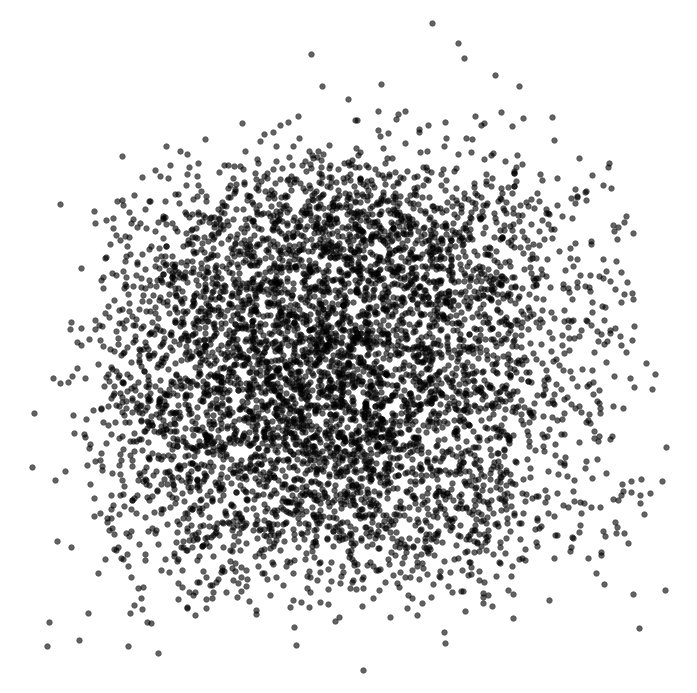

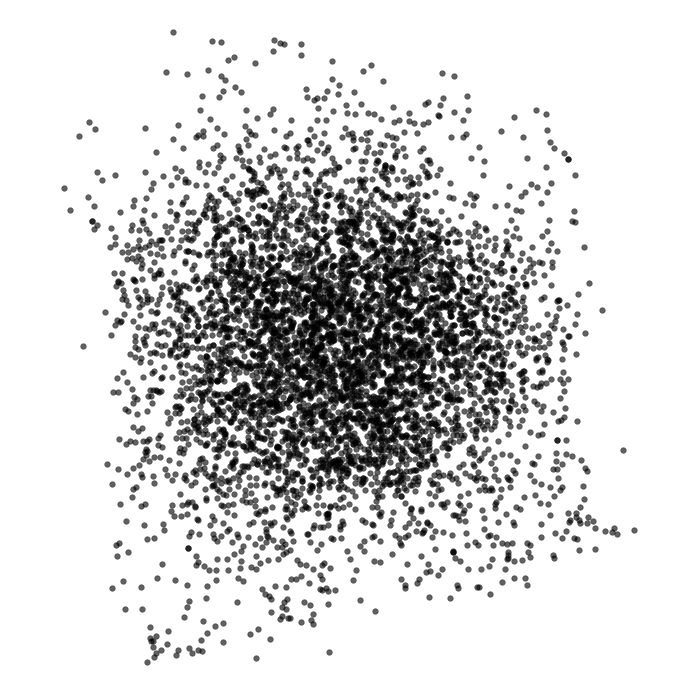

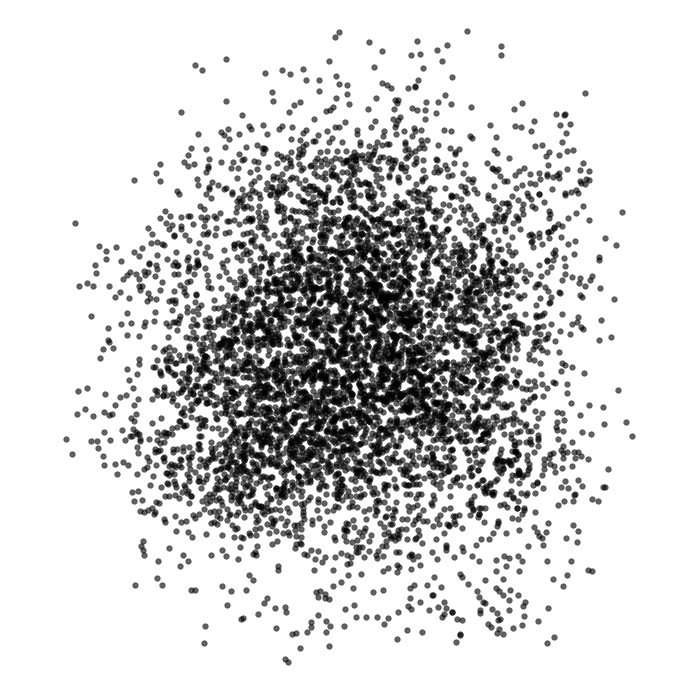

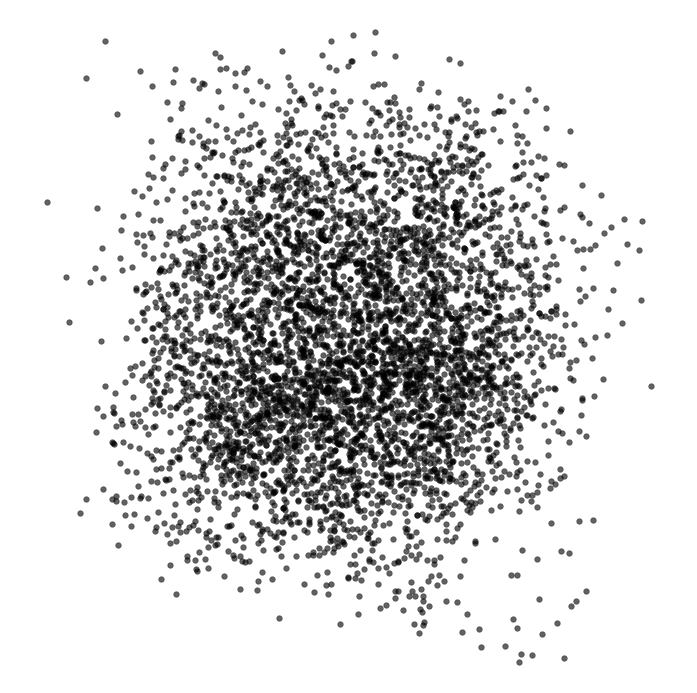

In [35]:
np.save("./centers7.npy", centers)

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

In [36]:
# matplotlib.rcParams['text.usetex'] = False
# plt.bar(range(len(shared_centers)), list(shared_centers.values()))
# plt.xticks(range(len(shared_centers)), list(shared_centers.keys()))
# plt.show()

matplotlib.rcParams['text.usetex'] = False

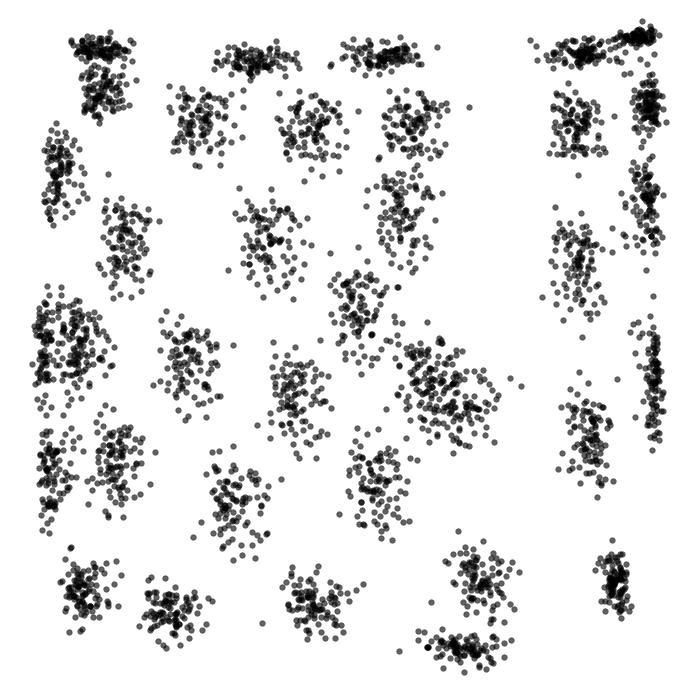

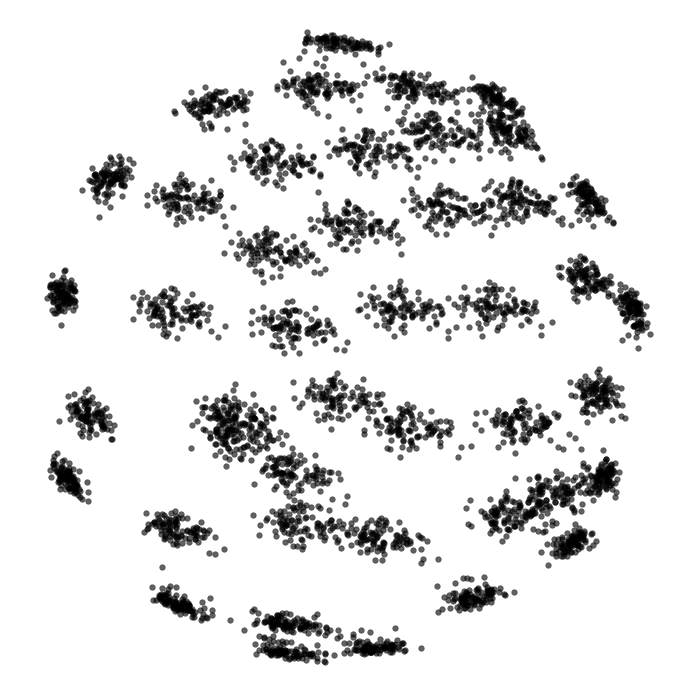

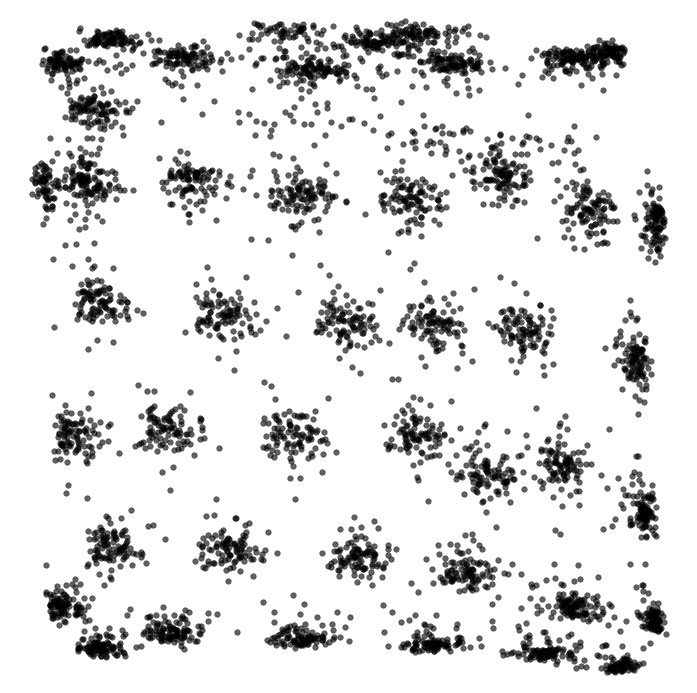

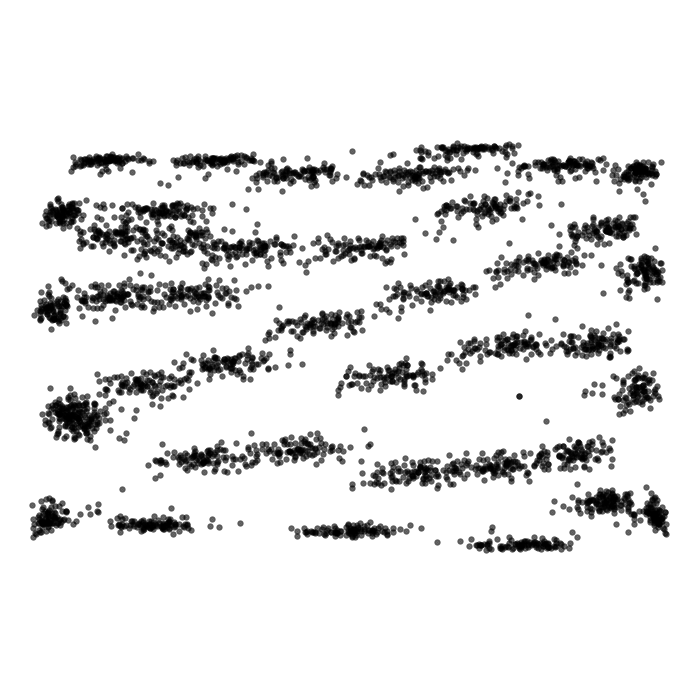

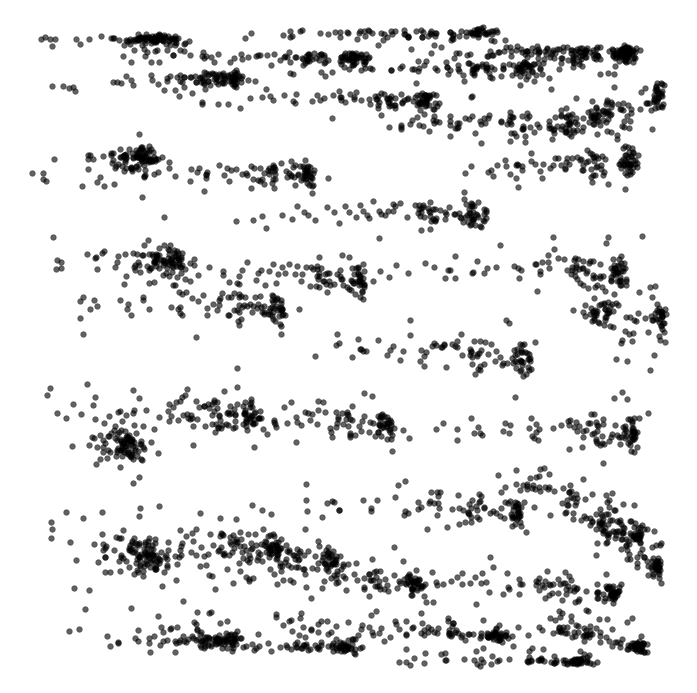

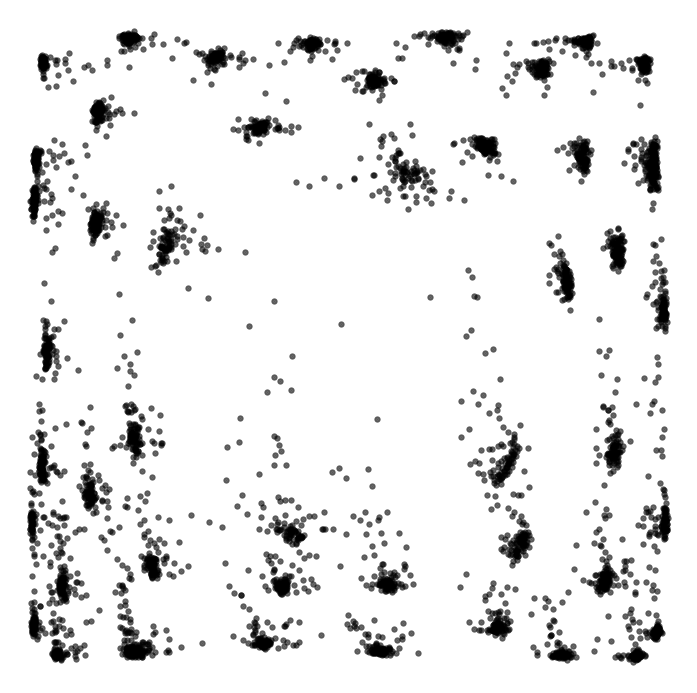

In [37]:
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
path = f"../models/al1_10_l2_0"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type) # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment

envs = environments.Environments()
envs = list(envs.envs) # :)

burn_in = 500

try:
    centers = np.load("./results/centers.npy")
    si_masks = np.load("./results/high_si_masks.npy")
    masks = np.load("./results/masks.npy")
except:
    centers = np.zeros((len(envs), samples, params["outputs"], 2))

    high_si_centers = []
    si_masks = []
    masks = []

    states = np.zeros(())
    for i, env in enumerate(tqdm(envs)):
        sequence = samples*[env] # sample environment several times
        x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                                context = params["context"], trajectories = trajectories)
        dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
        
        g, p, current_centers, preds = model.inference(dataset)
        centers[i] = current_centers
        
        mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
        si_masks.append(mask)
        high_si_centers.append(current_centers[:,mask])
        ###############################################
        mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
        masks.append(mask)


#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

In [38]:
center_positions = {}
for i in range(len(nonzero_centers)):
    for j in range(nonzero_centers[i].shape[0]):
        for k in range(nonzero_centers[i].shape[1]):
            pos = tuple(nonzero_centers[i][j][k])
            pos = (round(pos[0],4),round(pos[1],4))
            if pos in center_positions:
                center_positions[pos] += 1
            else:
                center_positions[pos] = 1
total_over_1 = 0
for key in center_positions:
    if center_positions[key] > 1:
        print(center_positions[key])
        total_over_1 += 1
# print(total_over_1)

2
2


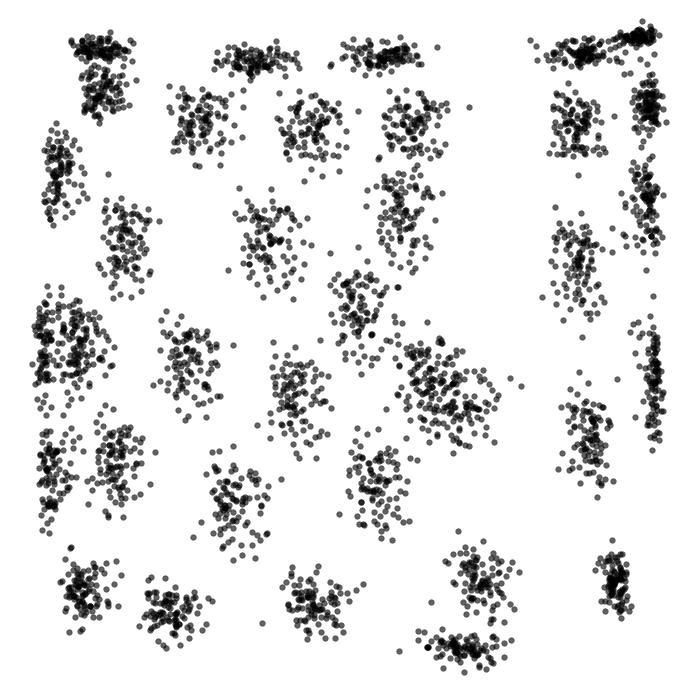

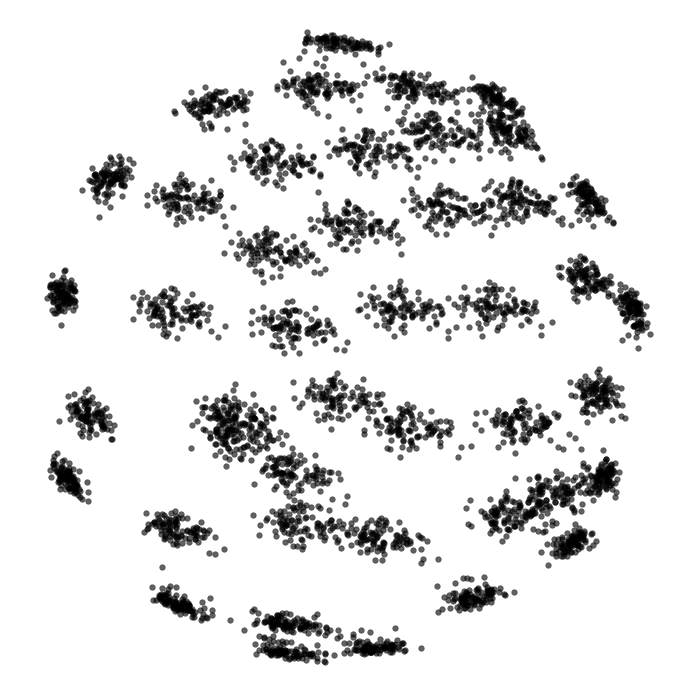

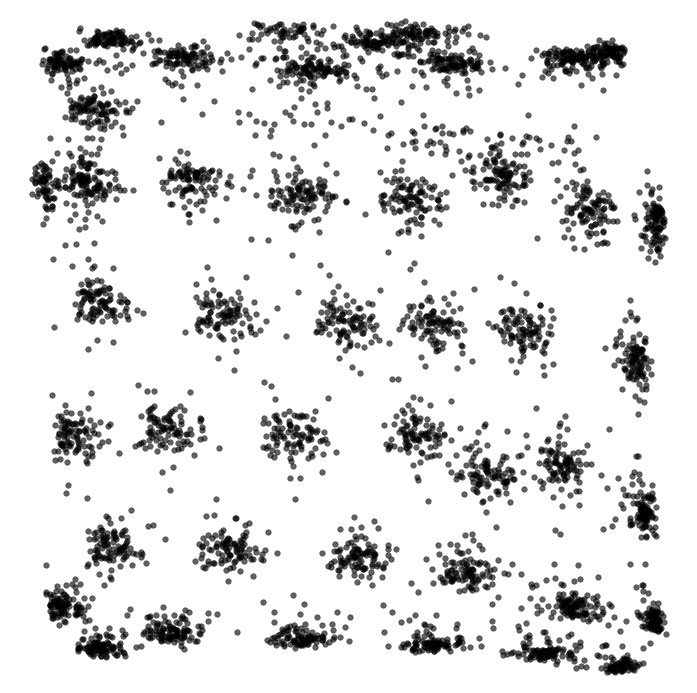

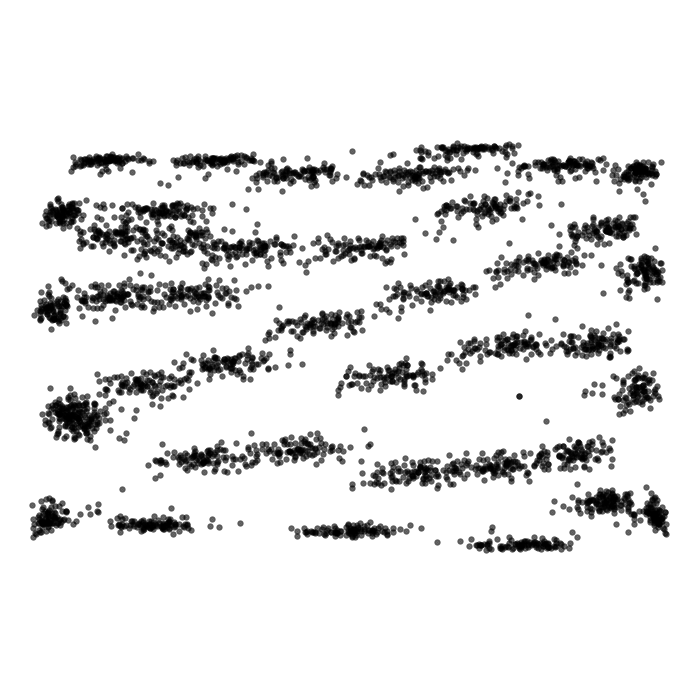

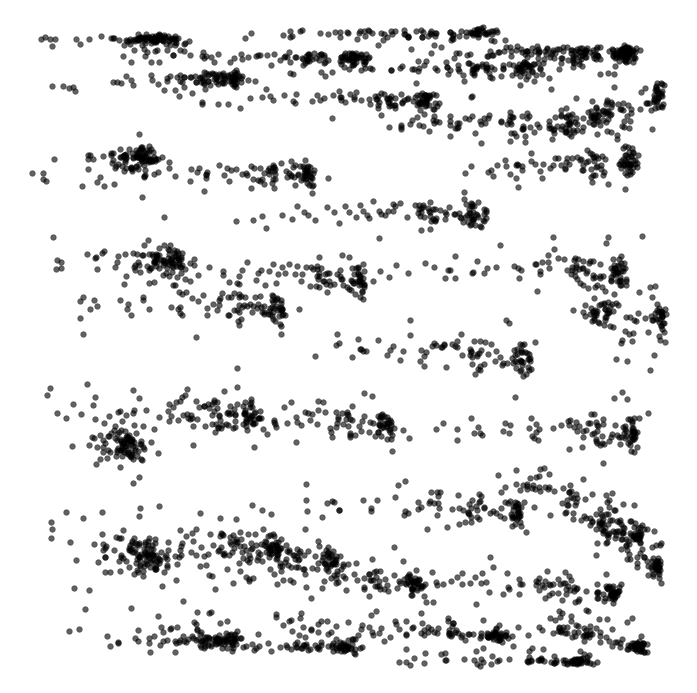

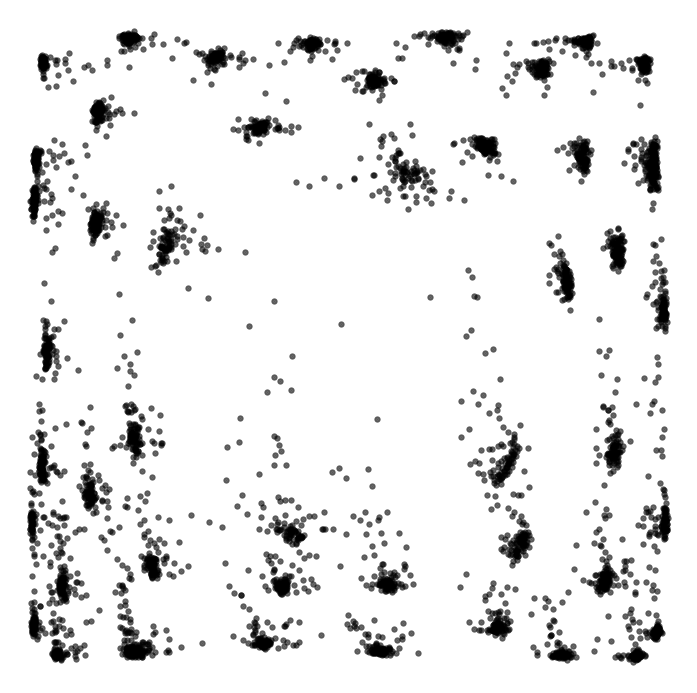

In [39]:
for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

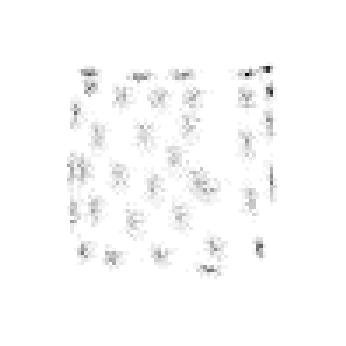

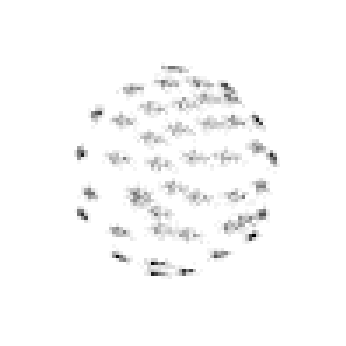

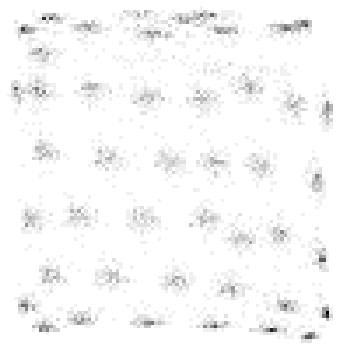

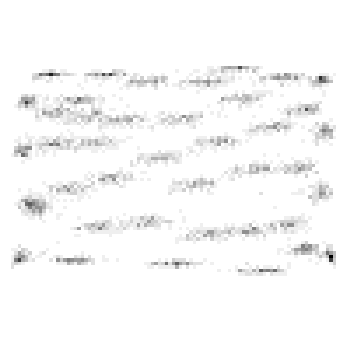

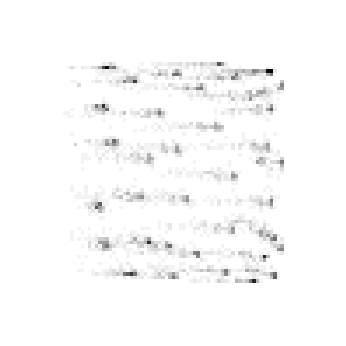

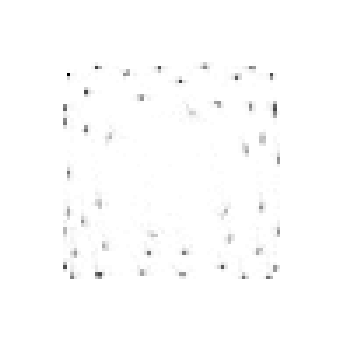

In [40]:
nr = 200
xx = np.linspace(-1.6, 1.6, nr)
lims = np.array([xx[0], xx[-1], xx[0], xx[-1]])

xx, yy = np.meshgrid(xx,xx)
r_eval = np.stack([xx.ravel(), yy.ravel()],axis=-1)

#xc = nonzero_centers[...,0].reshape(centers.shape[0], -1)
#yc = noncero_centers[...,1].reshape(centers.shape[0], -1)
bins = [np.linspace(-1.5, 1.5, 100)]*2

for i in range(len(centers)):
    xc = nonzero_centers[i][...,0].ravel()
    yc = nonzero_centers[i][...,1].ravel()

    hist = np.histogram2d(xc, yc, bins = bins)[0]
    plt.imshow(hist.T, origin = "lower", cmap = "binary")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")

    plt.show()
    


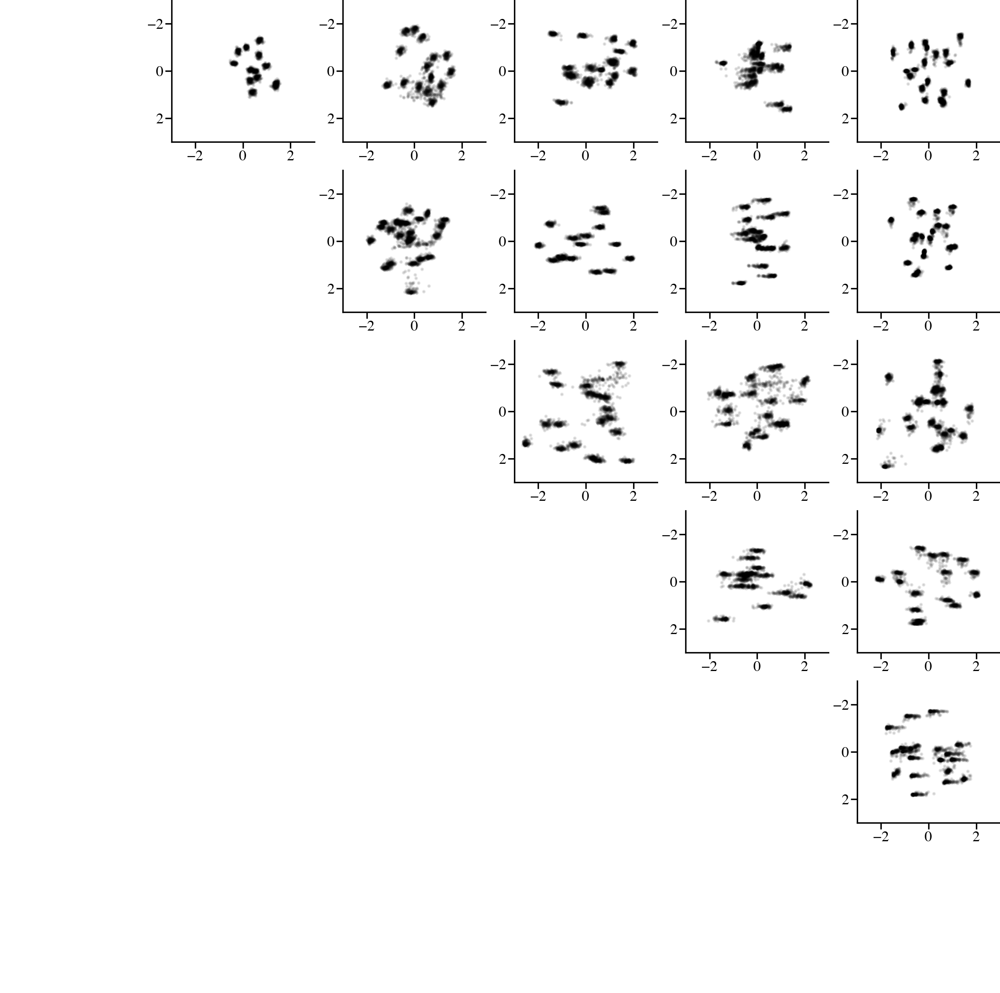

In [41]:
nb = 30
lims = np.array([-1.5, 1.5, 1.5, -1.5])*2

theta_bins = np.linspace(-np.pi, np.pi, nb)
fig, ax = plt.subplots(6,6,figsize = (10,10))
for i, a in enumerate(centers):
    for j, b in enumerate(centers):
        joint_mask = (si_masks[i]*si_masks[j]).astype("bool")
        diff = b[:,joint_mask] - a[:,joint_mask]
        if i <j:
            ax[i, j % 6].plot(diff[...,0], diff[...,1], "ok", alpha = 0.1)    
            ax[i, j % 6].axis(lims)
        else:
            ax[i, j % 6].axis("off")
            
#fig.savefig(f"./figures/high_si_shifts")

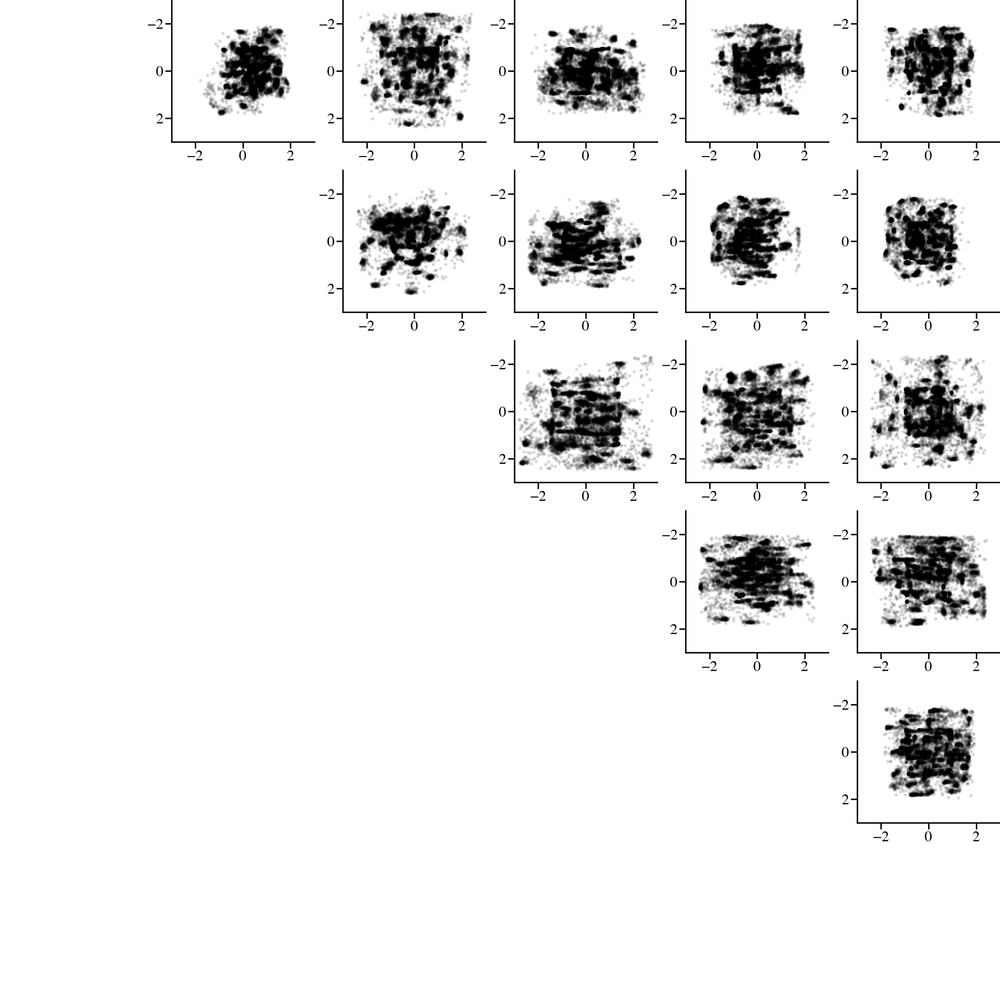

In [42]:
nb = 30
lims = np.array([-1.5, 1.5, 1.5, -1.5])*2

theta_bins = np.linspace(-np.pi, np.pi, nb)
fig, ax = plt.subplots(6,6,figsize = (10,10))
for i, a in enumerate(centers):
    for j, b in enumerate(centers):
        diff = b - a
        if i <j:
            ax[i, j % 6].plot(diff[...,0], diff[...,1], "ok", alpha = 0.1)    
            ax[i, j % 6].axis(lims)
        else:
            ax[i, j % 6].axis("off")
            
#fig.savefig(f"./figures/all_shifts")


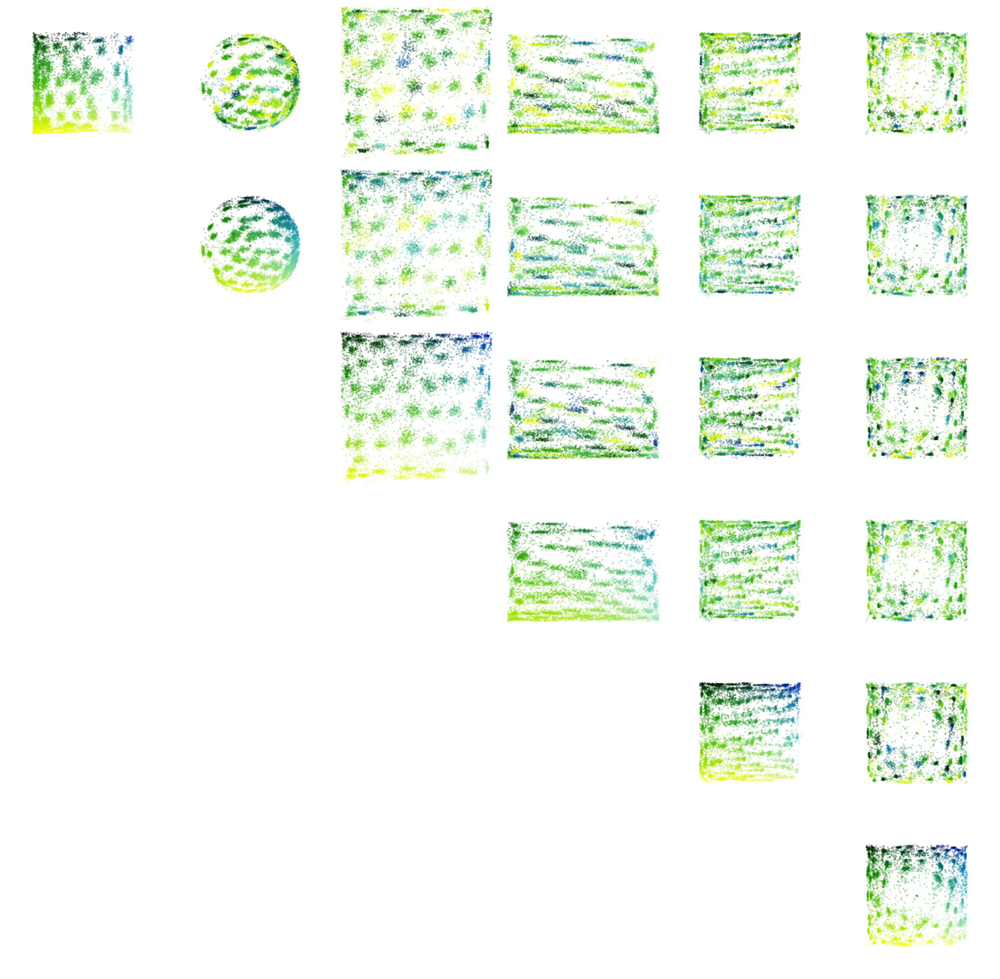

In [43]:
nb = 30
lims = np.array([-1.5, 1.5, 1.5, -1.5])*1.1

theta_bins = np.linspace(-np.pi, np.pi, nb)
fig, ax = plt.subplots(6,6,figsize = (10,10))

def spatial_rgb(pos):
    lim = np.amax(np.abs(pos))
    
    shifted = (pos - np.amin(pos))/(np.amax(pos) - np.amin(pos))
    # scale to (0, 1)
    # Mimic viridis
    col_b = shifted[...,0]**2*0.75
    col_r = shifted[...,1]**2
    col_g = shifted[...,1]**0.5 #np.zeros(col_b.shape)


    rgb = np.stack((col_r, col_g, col_b), axis = -1)
    return rgb

s = 1
alpha = 0.3

for i, a in enumerate(centers):
    for j, b in enumerate(centers):

        ax[i, j % 6].axis(lims)
        ax[i, j % 6].set_aspect("equal")
        ax[i, j % 6].axis("off")
        
        colors = spatial_rgb(a)
        c = colors[:,:]
        c = c.reshape(-1, 3)
        
        if i == j:
            ax[i, j % 6].scatter(a[:,:,0].ravel(), a[:,:,1].ravel(), c = c, s = s, alpha = alpha, edgecolor = "None")

        if j % 6 > i:
            ax[i, j % 6].scatter(b[:,:,0].ravel(), b[:,:,1].ravel(), c = c, s = s, alpha = alpha, edgecolor = "None")
        #if j % 6 < i:
        #    ax[i, j % 6].scatter(a[:,joint_mask,0].ravel(), a[:,joint_mask,1].ravel(), c = c)
        
plt.subplots_adjust(wspace = 0, hspace = -0.1)
#fig.savefig(f"./figures/track_color")

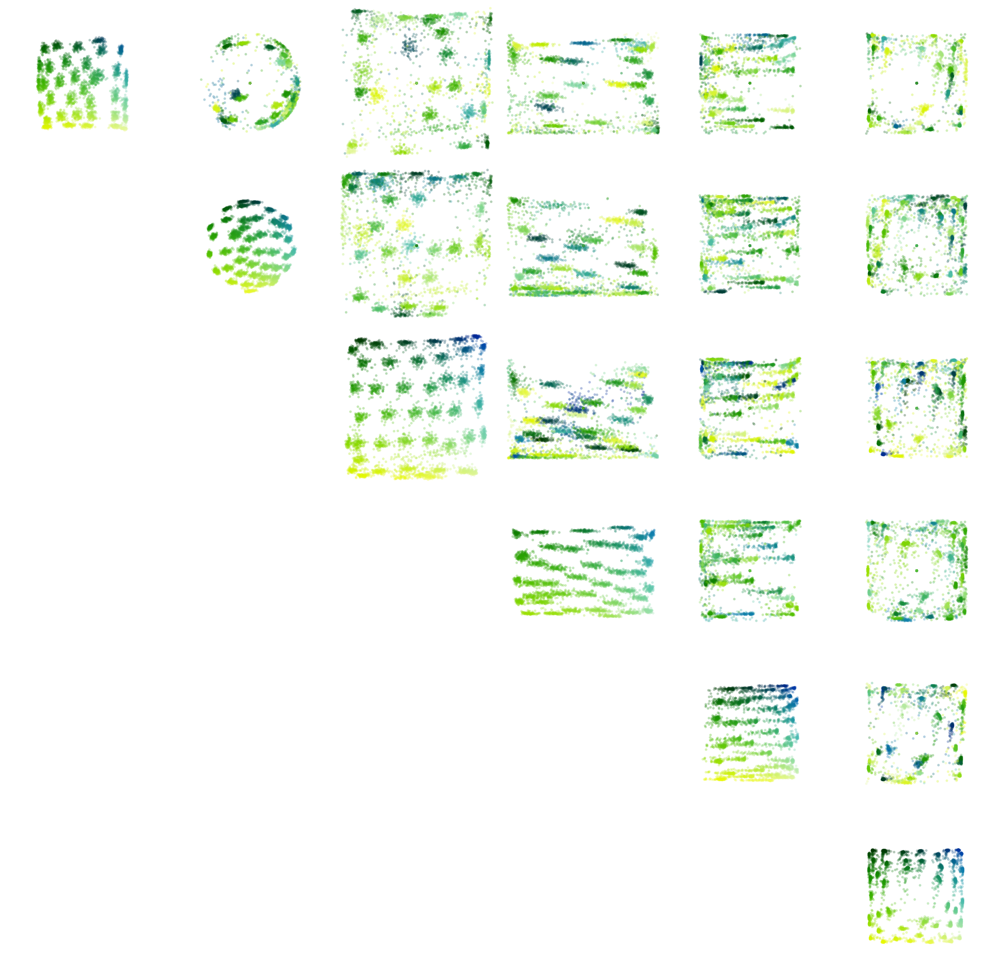

In [44]:
nb = 30
lims = np.array([-1.5, 1.5, 1.5, -1.5])*1.1

theta_bins = np.linspace(-np.pi, np.pi, nb)
fig, ax = plt.subplots(6,6,figsize = (10,10))
s = 2
alpha = 0.3

for i, a in enumerate(centers):
    for j, b in enumerate(centers):
        joint_mask = si_masks[i] # plot units that have high SI in a

        ax[i, j % 6].axis(lims)
        ax[i, j % 6].set_aspect("equal")
        ax[i, j % 6].axis("off")
        
        colors = spatial_rgb(a)
        c = colors[:,joint_mask]
        c = c.reshape(-1, 3)
        
        if i == j:
            ax[i, j % 6].scatter(a[:,joint_mask,0].ravel(), a[:,joint_mask,1].ravel(), c = c, s = s, alpha = alpha, edgecolor = "None")

        if j % 6 > i:
            ax[i, j % 6].scatter(b[:,joint_mask,0].ravel(), b[:,joint_mask,1].ravel(), c = c, s = s, alpha = alpha, edgecolor = "None")
        #if j % 6 < i:
        #    ax[i, j % 6].scatter(a[:,joint_mask,0].ravel(), a[:,joint_mask,1].ravel(), c = c)
        
plt.subplots_adjust(wspace = 0, hspace = -0.1)
#fig.savefig(f"./figures/track_color_high_si")


In [45]:
#np.save("./centers.npy", centers)

In [46]:
#np.save("./masks.npy", masks)

In [47]:
#np.save("./high_si_masks.npy", si_masks)

# Six Octagons

In [ ]:

%matplotlib inline
import sys
sys.path.insert(0, "../")
sys.path.insert(0, "../dataset_generator/")

import torch
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.style.use("project_style.mplstyle")
from tqdm import tqdm
import scipy

import environments
import analysis_tools
if trajectories := True:
    model_type = "RNN"
else:
    model_type = "FF"
    
# path = f"../models/al1_10_l2_0"
path = f"../VPC/model8"
model, params = analysis_tools.load_model(path, device = "cpu", model_type = model_type, name=f"/trained_{model_type}_model8") # model of interest
timesteps = 30000 # timesteps per sequence
samples = 100 # of samples for each environment
my_dict = {}

def rotation_matrix(theta):
    a = np.array([np.cos(theta), -np.sin(theta)])
    b = np.array([np.sin(theta), np.cos(theta)])
    return np.stack((a, b), axis=0)

def polygon(segments):
    # create some simple geometries consisting of regular polygons
    walls = np.zeros((segments, 2, 2))
    for i in range(1, segments + 1):
        for j in range(2):
            # j index ensures that end of one segment is start of next
            walls[i - 1, j, 0] = np.cos((i + j) * 2 * np.pi / segments)
            walls[i - 1, j, 1] = np.sin((i + j) * 2 * np.pi / segments)
    return walls

for i in range(6):
    my_dict[f"square{i}"] = polygon(8)

envs = environments.Environments(envs_dict=my_dict)
# envs = environments.Environments()
envs = list(envs.envs) # :)
print(envs)
burn_in = 500
envs = environments.Environments(envs_dict=my_dict)

# centers = np.load("./results/centers.npy")
# si_masks = np.load("./results/high_si_masks.npy")
# masks = np.load("./results/masks.npy")

centers = np.zeros((len(envs), samples, params["outputs"], 2))

high_si_centers = []
si_masks = []
masks = []



states = np.zeros(())
for i, env in enumerate(tqdm(envs.envs)):
    sequence = samples*[env] # sample environment several times
    x, r, v, c = analysis_tools.test_dataset(sequence, timesteps = timesteps, 
                                            context = params["context"], trajectories = trajectories,
                                            env=envs)
    dataset = [((x[0][i,None], x[1][i,None]), x[1][i,None]) for i in range(len(sequence))] # repackage
    
    g, p, current_centers, preds = model.inference(dataset)
    centers[i] = current_centers
    
    mask, info = analysis_tools.spatial_information_selection(p, r, [32, 32]*len(p));
    si_masks.append(mask)
    high_si_centers.append(current_centers[:,mask])
    ###############################################
    mask = np.amin(np.amax(p[:, burn_in:], axis = -2), axis = 0) > 0
    masks.append(mask)
print(sequence)
print(centers.shape)
print(centers)
#nonzero_centers = [centers[i, np.linalg.norm(centers[i], axis=-1) > 1e-2] for i in range(len(centers))]
nonzero_centers = [centers[i,:, si_masks[i]] for i in range(len(centers))]
#nonzero_centers = centers

#nonzero_centers = [centers[i,:, masks[i]] for i in range(len(centers))]
#centers[0].shape, masks[i].sum()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape
shared_centers = {}
for i in range(len(centers)):
    for j in range(centers[i].shape[0]):
        for k in range(centers[i].shape[1]):
            cell = (j,k)
            pos = tuple(centers[i][j][k])
            if pos[0] != 0 or pos[1] != 0:
                if cell in shared_centers:
                    shared_centers[cell] += 1
                else:
                    shared_centers[cell] = 1
            elif not cell in shared_centers:
                shared_centers[cell] = 0
total_over_1 = 0
for key in shared_centers:
    if shared_centers[key] > 1:
        print(shared_centers[key])
        total_over_1 += 1
# print(total_over_1)
bar_dict = {}
for key in shared_centers:
    val = shared_centers[key]
    if val in bar_dict:
        bar_dict[val] += 1
    else:
        bar_dict[val] = 1

matplotlib.rcParams['text.usetex'] = False
plt.bar(bar_dict.keys(), list(bar_dict[key] for key in bar_dict.keys()))
plt.xticks(list(range(7)))
plt.show()

total_cells = 0 
for key in bar_dict:
    total_cells += bar_dict[key]

print(f'{total_cells} total cells')
np.save("./centers8.npy", centers)
lims = np.array([-1.5, 1.5, -1.5, 1.5])*1.05
centers.shape, nonzero_centers[0].shape

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()

lims = np.array([-1.5, 1.5, -1.5, 1.5])*16.05
centers.shape, nonzero_centers[0].shape
print('*************************')

for i, cent in enumerate(nonzero_centers):
    plt.figure(figsize = (3,3))
    plt.plot(cent[...,0], cent[...,1], "k.", alpha = 0.65)
    plt.axis("equal")
    plt.axis("off")
    #plt.savefig(f"./figures/{envs[i]}_phases")
    plt.show()